This is the file to deal with the patent data linked with the ukbb papers 



ids of patents that having problem downloading: 

not_scrapped_ids  = ['US-12460264-B2',
 'US-12430766-B2',
 'US-12410476-B2',
 'US-12385096-B2',
 'US-12270073-B2',
 'US-12234509-B2',
 'US-12221653-B2',
 'US-11946101-B2',
 'US-11939634-B2']

In [ ]:
# if we only have the showcase pid and title 
#import pandas as pd
#df_showcase=pd.read_csv("/Users/valler/Python/RA/20_years_of_ukb/data/final_showcase_plus.csv")
#df_showcase['id'].to_csv("/Users/valler/Python/RA/evolution_of_science/data/showcase_pids_20260713.csv", index=False, header=False)
# to pickle 
#df_showcase['id'].to_pickle("/Users/valler/Python/RA/evolution_of_science/data/showcase_pids_20260713.pkl")

In [ ]:
import os 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from utils import patent_utils as patent
from collections import Counter, defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


os.chdir(Path.cwd().parent) # change the working directory to the parent directory of the current file, which is the root directory of the project. 

colors_scheme = ["#B80C09", 
                 "#D4AF37", 
                 "#6E8B3D",
                 "#345995"]

# set the plot overall dpi to 300 
plt.rcParams['figure.dpi'] = 300


In [2]:
# import file data
df_patent = pd.read_csv('data/patent/patents_detailed.csv')
# df_linked_papers = pd.read_csv('data/patenta/df_dimensions_with_patents.csv')
df_all_ukbb = pd.read_excel("data/df_dimensions.xlsx")
df_all_ukbb.drop(columns=['Unnamed: 0','Unnamed: 0.1'], inplace=True)


print(len(df_patent), len(df_all_ukbb))
df_patent['abstract'].isnull().sum()

513 10846


np.int64(16)

In [3]:
df_all_ukbb['authors_cleaned'] = df_all_ukbb.apply(patent.save_clean_authors, axis=1)
df_all_ukbb['country_codes'] = df_all_ukbb['authors'].apply(lambda x: patent.country_finder(x))
print(f"{df_all_ukbb.loc[df_all_ukbb['country_codes'].astype(str)=='[]',].shape[0]} rows have empty country codes, which is {102/len(df_all_ukbb):.2%} of the total rows.")

102 rows have empty country codes, which is 0.94% of the total rows.


In [4]:
# conservative: use only high-confidence rules and prefer assignee_names for guessing
df_with_iso = patent.assign_assignee_countries_with_iso(
    df_patent,
    assignee_col='assignees',
    assignee_names_col='assignee_names',
    use_low_confidence=False,
    primary_pick='first'
)

# more aggressive: allow 'Inc' -> US, etc.
df_with_iso_aggressive = patent.assign_assignee_countries_with_iso(
    df_patent,
    assignee_col='assignees',
    assignee_names_col='assignee_names',
    use_low_confidence=True,
    primary_pick='most_common'
)
df_with_iso_aggressive.to_csv('data/patent/df_with_iso_aggressive.csv', index=False)

In [5]:
print(f"{len(df_with_iso_aggressive.loc[['None' in str(x) for x in df_with_iso_aggressive['assignee_countries']],])} rows have 'None' in assignee_countries with aggressive rules.")

31 rows have 'None' in assignee_countries with aggressive rules.



```
# other possibility: 
# use inventors instead of assignees for country assignment, which is more likely to be accurate but may not reflect the actual assignee country.
df_with_iso_aggressive_by_inventor = patent.assign_assignee_countries_with_iso(
    df_patent,
    assignee_col='inventors',
    assignee_names_col='inventor_names',
    use_low_confidence=True,
    primary_pick='most_common'
)
print(f"{len(df_with_iso_aggressive_by_inventor.loc[['None' in str(x) for x in df_with_iso_aggressive_by_inventor['assignee_countries']],])} rows have 'None' in assignee_countries with aggressive rules.")

```

# 1. Basic Visualisation

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


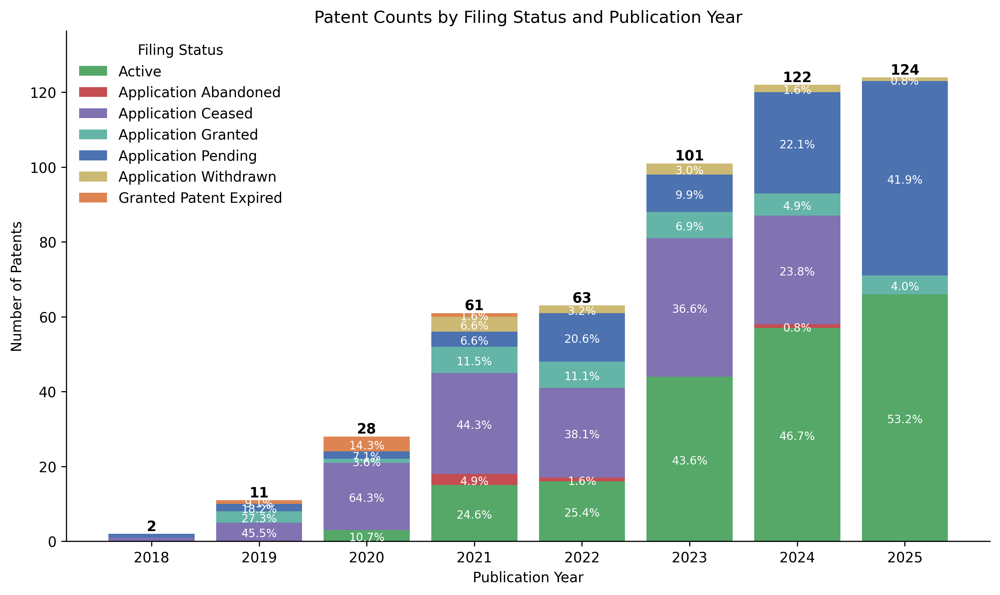

In [ ]:
col = 'legal_status_replaced'
patent.plot_filing_status_over_time(df_patent,col,figsize=(10, 6),savefigure=True)

In [ ]:
# create a showcase dataframe with only the most relevant columns for the showcase, and only include patents that are active or pending, which are more likely to be relevant for the showcase.
# don't run this if you don't need the showcase data

df_showcase = df_patent.loc[df_patent['legal_status_replaced'].isin(['Application Pending', 'Application Granted','Active']),['title','abstract','assignee_cities', 'assignee_countries', 'assignee_names', 'assignees',
       'category_for', 'category_for_2020', 'category_rcdc','date',
       'date_inserted', 'dimensions_url', 'expiration_date','ipcr', 'granted_date', 'granted_year','assignee_country_primary', 'assignee_country_source', 'topics_list',
       'top_level_topics', 'n_topics', 'country_list',
       'legal_status_replaced']].copy()


# clean abstract 
from utils.patent_utils import clean_patent_abstract

df_showcase['abstract_cleaned'] = df_showcase['abstract'].apply(lambda x: clean_patent_abstract(x))
df_showcase['title'] = df_showcase['title'].apply(lambda x: clean_patent_abstract(x).lower())

df_showcase = df_showcase[['title','abstract_cleaned','assignee_cities', 'assignee_countries', 'assignee_names', 'assignees',
       'category_for', 'category_for_2020', 'category_rcdc','date',
       'date_inserted', 'dimensions_url', 'expiration_date','ipcr', 'granted_date', 'granted_year','assignee_country_primary', 'assignee_country_source', 'topics_list',
       'top_level_topics', 'n_topics', 'country_list',
       'legal_status_replaced']]

df_showcase.to_csv('data/patent/df_patent_showcase.csv', index=False)


# 2. deal with the countries of the assignees (patent origin countries )

Use authoritative patent metadata (WIPO, PATSTAT, Open Patent services) first — if you have publication numbers, batch lookups are best.

In [8]:
column_to_show_counts = 'assignees' # 'assignee' or 'inventor'
if column_to_show_counts == 'inventor':
    df_with_iso_aggressive = patent.assign_assignee_countries_with_iso(
    df_patent,
    assignee_col='inventors',
    assignee_names_col='inventor_names',
    use_low_confidence=True,
    primary_pick='most_common'
)
else:
    df_with_iso_aggressive = patent.assign_assignee_countries_with_iso(
        df_patent,
        assignee_col='assignees',
        assignee_names_col='assignee_names',
        use_low_confidence=True,
        primary_pick='most_common'
    )

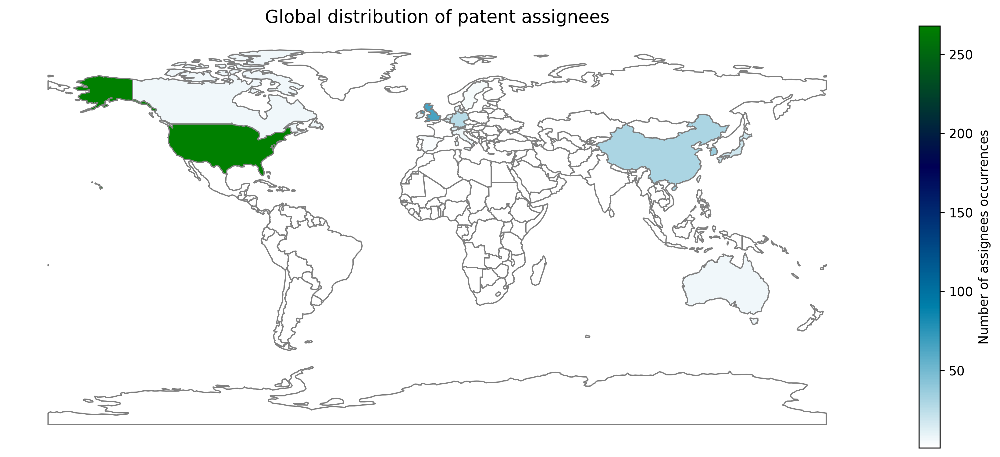

In [ ]:

country_df = patent.build_country_count(df_with_iso_aggressive)
patent.map_plotting(country_df, column_to_show_counts,figsize=(12, 8),savefigure=True)

## Optional: get the authors' countries for the UKBB papers

In [ ]:
counter = Counter(df_all_ukbb['country_codes'].explode())
country_count_ukbb = dict(counter)
country_count_ukbb_cleaned = {}
for key,value in country_count_ukbb.items():
    if str(key)!='nan':
        iso3_key = patent.iso2_to_iso3(key)
        country_count_ukbb_cleaned[key] = value
country_count_ukbb_cleaned['UK'] = country_count_ukbb_cleaned.pop('GB', 0)  # rename UK to GB if present

/var/folders/04/q8s7l0r939g8fqqljjn3_rbm0000gn/T/ipykernel_58455/1510861856.py:16: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006535628932351364' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  counts_df.at[idx, 'count'] /= country_count_ukbb_cleaned[row['iso2']]


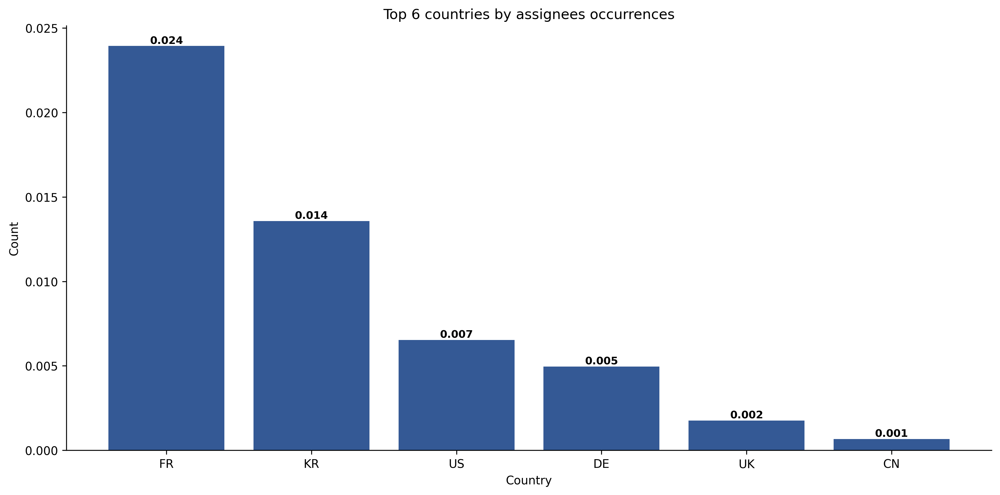

In [220]:
# 4) Optional fallback bar plot (matplotlib)

normalize_by_ukbb = True 
savefile = False
top_n = 10
patent_threshold = 20


counts_df = country_df[['iso2', 'count']].copy()
counts_df = counts_df[counts_df['count'] >= patent_threshold].copy()  # filter out countries below threshold
counts_df.replace({'iso2': {'GB': 'UK'}}, inplace=True)  # rename GB to UK for consistency with UKBB data
#Normalize counts by country totals 
if normalize_by_ukbb:
    for idx, row in counts_df.iterrows():
        if row['iso2'] in country_count_ukbb_cleaned.keys():
            counts_df.at[idx, 'count'] /= country_count_ukbb_cleaned[row['iso2']]

#plot_bar_matplotlib(counts_df, top_n=10, savefile='fig/patent/patent_countries_bar.png')


df = counts_df.sort_values('count', ascending=False).head(top_n).copy()
fig,ax = plt.subplots(figsize=(12,6))
ax.bar(df['iso2'], df['count'], color=colors_scheme[3])
# add annotations
for i, row in df.iterrows():
    ax.text(row['iso2'], row['count'], f"{round(row['count'],3)}", ha='center', va='bottom',fontsize=9,fontweight='bold')
ax.set_xlabel('Country')
ax.set_ylabel('Count')
ax.set_title('Top {} countries by {} occurrences'.format(min(top_n, len(df)), column_to_show_counts))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.tight_layout()
if savefile:
    plt.savefig(savefile, dpi=200)
    print(f"Bar chart saved to: {savefile}")
plt.show()


In [223]:
counts_df = country_df[['iso2', 'count']].copy() 
counts_df.rename(columns={'count': 'patent_count'}, inplace=True)
country_df['iso2'] = country_df['iso2'].replace({'GB': 'UK'})  # rename GB to UK for consistency with UKBB data
counts_df['paper_count'] = counts_df['iso2'].apply(lambda x: country_count_ukbb_cleaned.get(x, 0))
counts_df['patent_to_paper_ratio'] = counts_df.apply(lambda row: row['patent_count'] / row['paper_count'] if row['paper_count'] > 0 else np.nan, axis=1)
counts_df.sort_values('patent_to_paper_ratio', ascending=False, inplace=True)

In [224]:
counts_df

,iso2,patent_count,paper_count,patent_to_paper_ratio
19,PA,3,3,1.000000
22,LU,2,33,0.060606
7,BE,13,336,0.038690
10,IE,9,275,0.032727
2,FR,53,2214,0.023939
15,TW,6,281,0.021352
6,JP,18,1038,0.017341
18,IL,4,251,0.015936
3,KR,37,2725,0.013578
23,MX,1,77,0.012987


# 3. Topics  

In [16]:
df_patent = df_with_iso_aggressive.copy()

## Preprocess 

### IPC/CPC

In [17]:
cat_col = 'category_rcdc'

In [18]:
if cat_col =='ipcr':
    df_ipc = pd.read_csv("data/patent/ipc_hierarchy.csv")
    
    section_dict = {row['symbol']: row['title'].replace('/ ','') for _, row in df_ipc.loc[df_ipc['level']=='Section'].iterrows()}
    class_dict = {row['symbol']: row['title'].replace('/ ','') for _, row in df_ipc.loc[df_ipc['level']=='Class'].iterrows()}
    subclass_dict = {row['symbol']: row['title'].replace('/ ','') for _, row in df_ipc.loc[df_ipc['level']=='Subclass'].iterrows()}

    ipc_dict = {**section_dict, **class_dict, **subclass_dict}
    ipc_dict = {x:y.lower() for x,y in ipc_dict.items()}

    # extract IPC hierarchy levels from symbol
    df_ipc['section']= df_ipc['symbol'].str[0]
    df_ipc['class']= df_ipc['symbol'].str.extract(r'^([A-Z]\d{2})')[0]
    df_ipc['subclass']= df_ipc['symbol'].str.extract(r'^([A-Z]\d{2}[A-Z])')[0]
    df_ipc['main_group'] = df_ipc['symbol'].str.extract(r'^([A-Z]\d{2}[A-Z]\d{4})')[0]
    df_ipc['number_level_1'] = df_ipc['symbol'].str.extract(r'^[A-Z]\d{2}[A-Z](\d{4})')[0]
    df_ipc['number_level_2'] = df_ipc['symbol'].str.extract(r'^[A-Z]\d{2}[A-Z]\d{4}(\d{6})')[0]


### Other categories 

In [19]:
import ast 
if cat_col=='category_rcdc':
    df_patent[cat_col] = [ast.literal_eval(x) if isinstance(x, str) else [] for x in df_patent[cat_col]]
    cat_dict = {}
    for cats in df_patent[cat_col]:
        for c in cats:
            if isinstance(c, dict) and 'name' in c:
                cat_dict[c['id']] = c['name']
elif cat_col == 'category_hrcs_hc':
    df_patent[cat_col] = [ast.literal_eval(x) if isinstance(x, str) else [] for x in df_patent[cat_col]]
    cat_dict = {}
    for cats in df_patent[cat_col]:
        for c in cats:
            if isinstance(c, dict) and 'name' in c:
                cat_dict[c['id']] = c['name']

In [20]:

if cat_col=='category_rcdc':
    # load your full dataset
    df = df_with_iso_aggressive.copy()

    def extract_rcdc_ids(cell):
        if pd.isna(cell):
            return []
        # convert string to python object if needed
        if isinstance(cell, str):
            try:
                cell = ast.literal_eval(cell)
            except:
                return []
        return [item['id'] for item in cell if 'id' in item]

    df['rcdc_labels'] = df['category_rcdc'].apply(extract_rcdc_ids)

    # keep only needed columns
    df_clean = df[['id', 'rcdc_labels']].copy()
    df_clean.rename(columns={'id': 'patent_id'}, inplace=True)
    # save to file for macro pipeline
    df_clean.to_csv(os.getcwd()+"/data/patent/category/patents_for_macro_rcdc.csv", index=False)
    


In [21]:
if cat_col =='category_rcdc':
    df_rcdc_macro_labels = pd.read_csv(os.getcwd()+"/file/paten_rcdc_macro/cluster_label_summary_louvain.csv")

    df_rcdc_macro_labels['top_label_names'] = df_rcdc_macro_labels['top_labels'].apply(lambda x: [cat_dict.get(lab, "Unknown") for lab in x.split(';')])

    macro_cluster_names = {
        0: "Stem Cell & Regenerative Medicine",
        1: "Biomedical Engineering & Digital Health",
        2: "Aging & Neurodegenerative Disorders",
        3: "Mental Health & Behavioral Disorders",
        4: "Genomic & Precision Medicine",
        5: "Metabolic & Hepatic Disorders",
        6:"Infectious & Rare Disease Research "
    }
    df_rcdc_macro_labels['cluster_names'] = df_rcdc_macro_labels['community'].map(macro_cluster_names)
    top_topic_dict = {x:y.split(";") for x,y in zip(df_rcdc_macro_labels['community'], df_rcdc_macro_labels['all_labels'])}
    code_to_macro = {
    code: macro
    for macro, code_list in top_topic_dict.items()
    for code in code_list}
    

## 3.2 analysing pipeline 

In [22]:
cat_col = 'category_rcdc'

In [23]:
if cat_col =='category_for':
    df_patent['topics_list'] = df_patent[cat_col].apply(
    lambda x: patent.extract_topic_names(patent.safe_parse_category(x, cat_dict))
)
elif cat_col=='category_rcdc':
    df_patent['topics_list'] = [ [m['id'] for m in x] if isinstance(x, list) else [] for x in df_patent[cat_col]]
    df_patent['top_level_topics'] = df_patent['topics_list'].apply(lambda topics: list({code_to_macro.get(code) for code in topics if code in code_to_macro}))
elif cat_col=='ipcr':
    df_patent[cat_col] = df_patent[cat_col].fillna('[]').apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])
    df_patent['topics_list_raw']= df_patent[cat_col].apply(lambda codes: [patent.map_ipcr_code_to_standardized_code(c) for c in codes if isinstance(c, str)] if isinstance(codes, list) else [])
    df_patent['topics_list'] = df_patent['topics_list_raw'].apply(patent.map_ipc_topic_titles)
df_patent['n_topics'] = df_patent['topics_list'].apply(len)

Average number of topics per patent: 3.31
Median number of topics per patent: 2


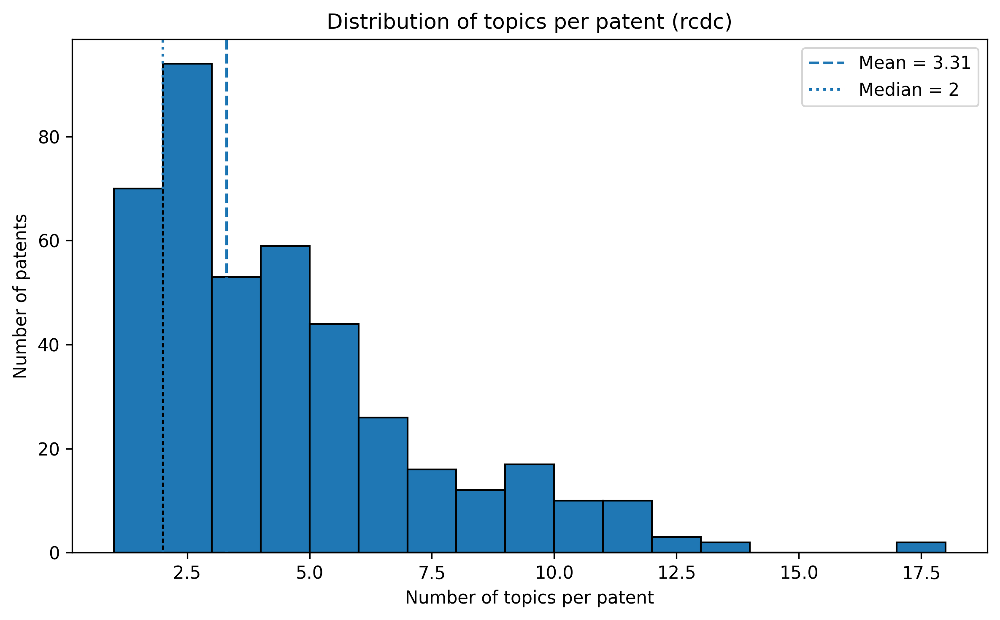

In [ ]:
patent.plot_topics_distribution(df_patent, cat_col, figsize=(10,6), savefigure=True)

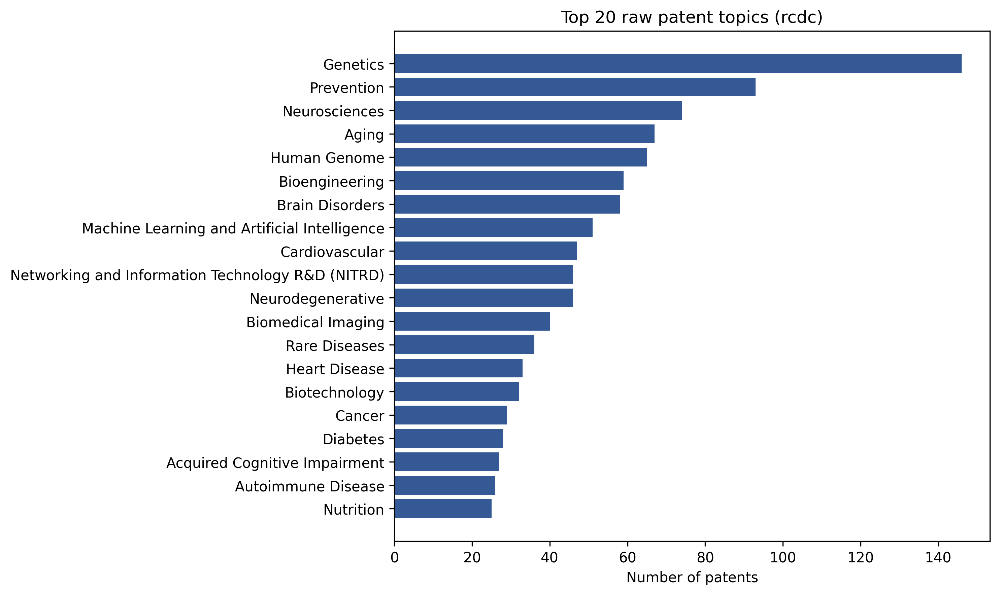

In [ ]:


topic_counter = Counter()

for topics in df_patent['topics_list']:
    for t in topics:
        topic_counter[t] += 1

topic_df = (
    pd.DataFrame(topic_counter.items(), columns=['topic', 'count'])
      .sort_values('count', ascending=False)
      .reset_index(drop=True)
)

TOP_N = 20
plot_df = topic_df.head(TOP_N)

plt.figure(figsize=(10, 6))
plt.barh(plot_df['topic'], plot_df['count'], color=colors_scheme[3])
plt.gca().invert_yaxis()  # highest on top

plt.xlabel('Number of patents')
plt.title(f'Top {TOP_N} raw patent topics ({cat_col.replace("category_", "")})')

display_chars= 40

if cat_col in ['category_rcdc', 'category_hrcs_hc']:
    labels = [cat_dict.get(str(t), t) for t in plot_df['topic']]
    plt.yticks(ticks=range(len(plot_df)), labels=labels)

else:
# only display up to display_chars characters of topic name for readability
    plt.yticks(ticks=range(len(plot_df)), labels=[t[:display_chars]+ '...' if len(t)>display_chars else t for t in plot_df['topic']])
plt.tight_layout()
plt.show()

In [ ]:
# get the top_level_topics for each patent and count occurrences
if cat_col == 'category_for':
    level = 'derived top level'
    # -----------------------
    # Build topics_list column (list of topic dicts -> list of names)
    # -----------------------
    # If not present yet, create topics_list as list of dicts for each row
    df_patent = df_patent.copy()
    df_patent['category_parsed'] = df_patent['category_for'].apply(patent.safe_parse_category)
    df_patent['top_level_topics'] = df_patent['category_parsed'].apply(patent.collapse_to_top_level)

    topcode_to_label = {}
    for lst in df_patent['top_level_topics']:
        for code, label in lst:
            if code is None:
                continue
            if code not in topcode_to_label or not topcode_to_label[code]:
                if label and isinstance(label, str) and label.strip():
                    topcode_to_label[code] = label.strip()
    # Choose fractional or raw
    agg_df =  patent.aggregate_topcodes(df_patent, fractional=True)

elif cat_col == 'ipcr':
    level = 'subclass' # section, class, or subclass
    df_patent['top_level_topics'] = df_patent['topics_list_raw'].apply(lambda topics: patent.ipc_code_to_top_level(topics,level))
    if level =='subclass':
        topic_short_names = {
        "measuring or testing processes involving enzymes, nucleic acids or microorganisms compositions or test papers therefor processes of preparing such compositions condition-responsive control in microbiological or enzymological processes":
            "Enzyme & Microbial Testing",

        "bioinformatics, i.e. information and communication technology [ict] specially adapted for genetic or protein-related data processing in computational molecular biology":
            "Bioinformatics",

        "preparations for medical, dental or toiletry purposes":
            "Medical Preparations",

        "specific therapeutic activity of chemical compounds or medicinal preparations":
            "Therapeutic Compounds",

        "healthcare informatics, i.e. information and communication technology [ict] specially adapted for the handling or processing of medical or healthcare data":
            "Healthcare Informatics",

        "image data processing or generation, in general":
            "Image Processing",

        "microorganisms or enzymes compositions thereof propagating, preserving, or maintaining microorganisms mutation or genetic engineering culture media":
            "Microbial Engineering",

        "investigating or analysing materials by determining their chemical or physical properties":
            "Material Analysis",

        "diagnosis surgery identification":
            "Medical Diagnosis & Surgery",

        "heterocyclic compounds":
            "Heterocyclic Compounds",

        "computing arrangements based on specific computational models":
            "Computational Models",

        "electric digital data processing":
            "Digital Data Processing",

        "peptides":
            "Peptides",

        "image or video recognition or understanding":
            "Image & Video Recognition",

        "measuring electric variables measuring magnetic variables":
            "Electrical & Magnetic Measurement",

        "acyclic, carbocyclic, or heterocyclic compounds containing elements other than carbon, hydrogen, halogen, oxygen, nitrogen, sulfur, selenium or tellurium":
            "Special Chemical Compounds",

        "fermentation or enzyme-using processes to synthesise a desired chemical compound or composition or to separate optical isomers from a racemic mixture":
            "Fermentation & Enzyme Synthesis",

        "devices for introducing media into, or onto, the body devices for transducing body media or for taking media from the body devices for producing or ending sleep or stupor":
            "Medical Delivery Devices",

        "electrotherapy magnetotherapy radiation therapy ultrasound therapy":
            "Therapeutic Devices",

        "foods, foodstuffs or non-alcoholic beverages, not otherwise provided for preparation or treatment thereof":
            "Food & Beverage Processing"
    }
        
    fractional = True
    agg_df = patent.aggregate_topcodes(df_patent, fractional=True,topcode_to_label=ipc_dict)
    
elif cat_col=='category_rcdc':


    fractional = True
    agg_df = patent.aggregate_topcodes(df_patent, fractional=True,topcode_to_label=macro_cluster_names)


In [44]:
if cat_col == 'ipcr':
    # -----------------------
    # Plot top N with names on Y-axis (horizontal bars)
    # -----------------------
    TOP_N = 20 if len(agg_df) >= 20 else len(agg_df)
    plot_df = agg_df.head(TOP_N).copy()

    # label: "32 Biomedical and Clinical Sciences"
    if level == 'subclass':
        plot_df['bar_label'] = plot_df.apply(lambda r: f"{topic_short_names.get(r['label'], r['label'])}", axis=1)
        plot_df['bar_label'] = plot_df['bar_label'].str.capitalize()
    else:
        plot_df['bar_label'] = plot_df.apply(
            lambda r: f"{r['label']}", axis=1
        )

    fig, ax = plt.subplots(figsize=(12, 8))

    y = np.arange(len(plot_df))
    bars = ax.barh(y, plot_df['count'], edgecolor='black', color=colors_scheme[3])

    # annotate counts at end of bars
    x_offset = plot_df['count'].max() * 0.01  # small padding
    for bar, cnt in zip(bars, plot_df['count']):
        ax.text(
            bar.get_width() + x_offset,
            bar.get_y() + bar.get_height() / 2,
            f"{cnt:.0f}" if not fractional else f"{cnt:.2f}",
            va='center',
            ha='left',
            fontsize=9,
            fontweight='bold'
        )

    # y-axis labels
    ax.set_yticks(y)
    display_chars= 60
    ax.set_yticklabels(labels=[t[:display_chars].lower().capitalize()+ '...' if len(t)>display_chars else t.lower().capitalize() for t in plot_df['bar_label']])


    # highest value on top
    ax.invert_yaxis()

    ax.set_xlabel('Count (occurrences)' if not fractional else 'Fractional count (patent-weighted)')
    ax.set_title(
        f"Top {min(TOP_N, len(plot_df))} collapsed FOR {level if level else 'top-level'} topics"
    )

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.tight_layout()
    plt.show()

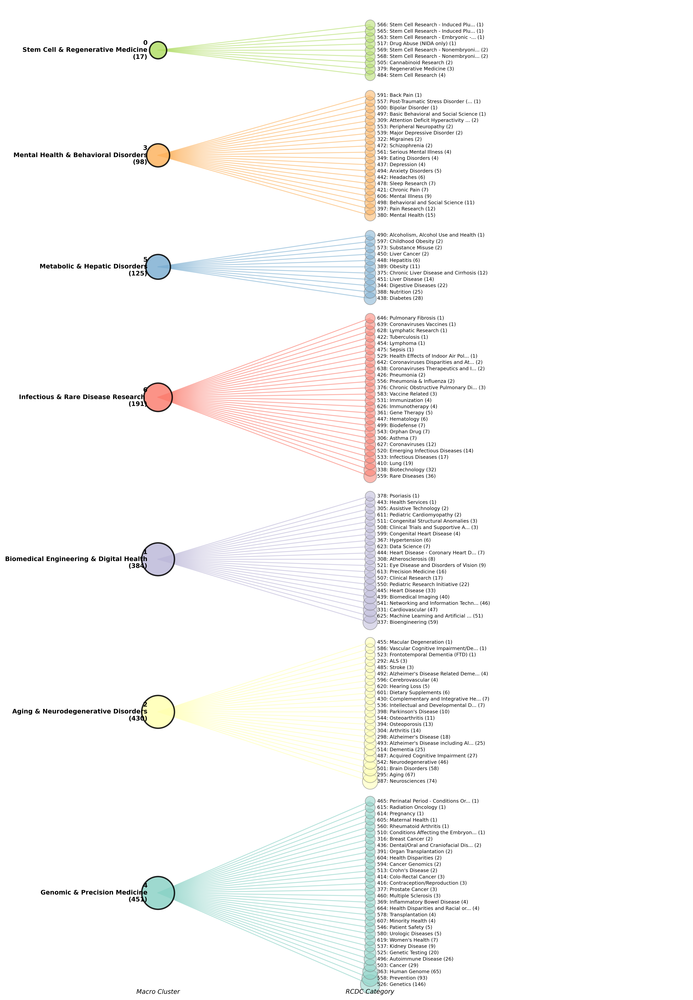

In [ ]:
if cat_col == 'category_for':
    # -----------------------
    # Dendrogram-style hierarchical plot: FoR (L2 -> L4)
    # -----------------------
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.lines import Line2D

    # Reuse the hier_df from previous cell
    if not hier_df.empty:
        # Aggregate counts
        counts = (
            hier_df
            .groupby(["L2_code", "L2_label", "L4_code", "L4_label"])
            .size()
            .reset_index(name="count")
        )
        
        # Filter to top L2 categories
        TOP_L2 = 8
        l2_totals = counts.groupby(["L2_code", "L2_label"])["count"].sum().reset_index()
        l2_totals = l2_totals.sort_values("count", ascending=False).head(TOP_L2)
        
        # Filter counts to only include these L2s
        counts = counts.merge(
            l2_totals[["L2_code"]], on="L2_code", how="inner"
        )
        
        # Sort L2s by total count (top to bottom)
        l2_order = l2_totals["L2_code"].tolist()
        
        # Create figure
        fig, ax = plt.subplots(figsize=(12, 18))
        
        # Color scheme for L2 categories
        colors = plt.cm.Set3(range(len(l2_order)))
        l2_colors = dict(zip(l2_order, colors))
        
        # Position parameters
        y_spacing = 1.5  # vertical spacing between L2 categories
        x_l2 = 0  # x position for L2 nodes
        x_l4 = 5  # x position for L4 nodes
        y_current = 0
        
        # Store positions for drawing
        l2_positions = {}
        l4_positions = {}
        
        # Draw each L2 category and its L4 children
        for l2_idx, l2_code in enumerate(l2_order):
            l2_data = counts[counts["L2_code"] == l2_code]
            l2_label = l2_data["L2_label"].iloc[0]
            l2_total = l2_data["count"].sum()
            
            # Get L4 children, sorted by count
            l4_children = (
                l2_data.groupby(["L4_code", "L4_label"])["count"]
                .sum()
                .reset_index()
                .sort_values("count", ascending=False)
            )
            
            # Calculate vertical span for this L2 group
            n_children = len(l4_children)
            l4_y_start = y_current
            l4_y_spacing = 0.8
            
            # Position L2 node at midpoint of its children
            l2_y = l4_y_start + (n_children - 1) * l4_y_spacing / 2
            l2_positions[l2_code] = (x_l2, l2_y)
            
            # Draw L2 node
            circle_size = min(2000, 500 + l2_total * 5)
            ax.scatter(
                x_l2, l2_y, s=circle_size,
                color=l2_colors[l2_code], edgecolor="black", linewidth=2,
                zorder=3, alpha=0.8
            )
            
            # Label L2 node
            ax.text(
                x_l2 - 0.3, l2_y,
                f"{l2_code}\n{l2_label}\n({l2_total})",
                ha="right", va="center", fontsize=9, fontweight="bold"
            )
            
            # Draw L4 children
            for child_idx, (_, l4_row) in enumerate(l4_children.iterrows()):
                l4_code = l4_row["L4_code"]
                l4_label = l4_row["L4_label"]
                l4_count = l4_row["count"]
                
                l4_y = l4_y_start + child_idx * l4_y_spacing
                l4_positions[l4_code] = (x_l4, l4_y)
                
                # Draw connection line
                ax.plot(
                    [x_l2, x_l4], [l2_y, l4_y],
                    color=l2_colors[l2_code], linewidth=1.5, alpha=0.6,
                    zorder=1
                )
                
                # Draw L4 node
                l4_circle_size = min(800, 200 + l4_count * 3)
                ax.scatter(
                    x_l4, l4_y, s=l4_circle_size,
                    color=l2_colors[l2_code], edgecolor="gray", linewidth=1,
                    zorder=2, alpha=0.5
                )
                
                # Label L4 node (truncate if too long)
                l4_text = l4_label if len(l4_label) <= 30 else l4_label[:27] + "..."
                ax.text(
                    x_l4 + 0.2, l4_y,
                    f"{l4_code}: {l4_text} ({l4_count})",
                    ha="left", va="center", fontsize=7
                )
            
            # Update y position for next L2 group
            y_current += (n_children * l4_y_spacing) + y_spacing
        
        # Formatting
        ax.set_xlim(-2, 12)
        ax.set_ylim(-1, y_current)
        ax.set_aspect("auto")
        ax.axis("off")
        
        #ax.set_title( f"FoR Hierarchy: Top {TOP_L2} Division → Group", fontsize=14, fontweight="bold", pad=20)
        
        # Add legend
        ax.text(
            x_l2, -0.5,
            "← Division",
            ha="center", va="top", fontsize=9, style="italic"
        )
        ax.text(
            x_l4, -0.5,
            "Group →",
            ha="center", va="top", fontsize=9, style="italic"
        )
        
        plt.tight_layout()
        plt.show()
    else:
        print("No hierarchy data available for dendrogram plot.")

elif cat_col == 'category_rcdc':
    # -----------------------
    # Dendrogram-style hierarchical plot: RCDC macro -> original categories
    # Two-level hierarchy visualization
    # -----------------------
    import matplotlib.pyplot as plt

    rcdc_rows = []
    for _, row in df_patent.iterrows():
        macro_topics = row.get('top_level_topics', [])
        raw_topics = row.get(cat_col, [])

        if isinstance(raw_topics, str):
            try:
                raw_topics = ast.literal_eval(raw_topics)
            except Exception:
                raw_topics = []

        if not isinstance(macro_topics, list) or not isinstance(raw_topics, list):
            continue

        for topic in raw_topics:
            if not isinstance(topic, dict):
                continue

            rcdc_id = topic.get('id')
            if rcdc_id is None:
                continue

            rcdc_id_str = str(rcdc_id)
            macro_code = code_to_macro.get(rcdc_id_str, code_to_macro.get(rcdc_id))
            if macro_code is None or macro_code not in macro_topics:
                continue

            rcdc_label = topic.get('name')
            if not rcdc_label:
                rcdc_label = cat_dict.get(rcdc_id_str, cat_dict.get(rcdc_id, f'RCDC {rcdc_id_str}'))

            rcdc_rows.append({
                'macro_code': macro_code,
                'macro_label': macro_cluster_names.get(macro_code, f'Macro {macro_code}'),
                'rcdc_id': rcdc_id_str,
                'rcdc_label': rcdc_label
            })

    hier_df_rcdc = pd.DataFrame(rcdc_rows)

    if not hier_df_rcdc.empty:
        counts = (
            hier_df_rcdc
            .groupby(['macro_code', 'macro_label', 'rcdc_id', 'rcdc_label'])
            .size()
            .reset_index(name='count')
        )

        TOP_MACRO = 8
        macro_totals = (
            counts.groupby(['macro_code', 'macro_label'])['count']
            .sum()
            .reset_index()
            .sort_values('count', ascending=False)
            .head(TOP_MACRO)
        )

        counts = counts.merge(macro_totals[['macro_code']], on='macro_code', how='inner')
        macro_order = macro_totals['macro_code'].tolist()

        fig, ax = plt.subplots(figsize=(14, 20))

        colors = plt.cm.Set3(range(len(macro_order)))
        macro_colors = dict(zip(macro_order, colors))

        y_spacing = 1.5
        x_macro = 0
        x_rcdc = 6
        y_current = 0

        for macro_code in macro_order:
            macro_data = counts[counts['macro_code'] == macro_code]
            macro_label = macro_data['macro_label'].iloc[0]
            macro_total = macro_data['count'].sum()

            children = (
                macro_data.groupby(['rcdc_id', 'rcdc_label'])['count']
                .sum()
                .reset_index()
                .sort_values('count', ascending=False)
            )

            n_children = len(children)
            child_y_start = y_current
            child_y_spacing = 0.7
            macro_y = child_y_start + (n_children - 1) * child_y_spacing / 2

            macro_size = min(2200, 500 + macro_total * 6)
            ax.scatter(
                x_macro, macro_y, s=macro_size,
                color=macro_colors[macro_code], edgecolor='black', linewidth=2,
                zorder=3, alpha=0.85
            )

            ax.text(
                x_macro - 0.3, macro_y,
                f"{macro_code}\n{macro_label}\n({macro_total})",
                ha='right', va='center', fontsize=9, fontweight='bold'
            )

            for child_idx, (_, child_row) in enumerate(children.iterrows()):
                rcdc_id = child_row['rcdc_id']
                rcdc_label = child_row['rcdc_label']
                rcdc_count = child_row['count']
                child_y = child_y_start + child_idx * child_y_spacing

                ax.plot(
                    [x_macro, x_rcdc], [macro_y, child_y],
                    color=macro_colors[macro_code], linewidth=1.3, alpha=0.6, zorder=1
                )

                child_size = min(900, 200 + rcdc_count * 4)
                ax.scatter(
                    x_rcdc, child_y, s=child_size,
                    color=macro_colors[macro_code], edgecolor='gray', linewidth=1,
                    zorder=2, alpha=0.55
                )

                child_text = rcdc_label if len(rcdc_label) <= 35 else rcdc_label[:32] + '...'
                ax.text(
                    x_rcdc + 0.2, child_y,
                    f"{rcdc_id}: {child_text} ({rcdc_count})",
                    ha='left', va='center', fontsize=7
                )

            y_current += (n_children * child_y_spacing) + y_spacing

        ax.set_xlim(-2, 15)
        ax.set_ylim(-1, y_current)
        ax.set_aspect('auto')
        ax.axis('off')

        ax.text(x_macro, -0.5, 'Macro Cluster', ha='center', va='top', fontsize=9, style='italic')
        ax.text(x_rcdc, -0.5, 'RCDC Category', ha='center', va='top', fontsize=9, style='italic')

        plt.tight_layout()
        plt.show()
    else:
        print('No category_rcdc hierarchy data available for dendrogram plot.')

elif cat_col == 'ipcr':
    # -----------------------
    # Dendrogram-style hierarchical plot: IPC (Section -> Class -> Subclass -> Main Group)
    # 4-level hierarchy visualization
    # -----------------------
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.lines import Line2D
   
    
    # Build hierarchy data from topics_list_raw with all 4 levels
    ipc_rows = []
    for idx, row in df_patent.iterrows():
        topics_raw = row.get('topics_list_raw', [])
        if not isinstance(topics_raw, list):
            continue
        
        for ipc_code in topics_raw:
            if not ipc_code:
                continue
            
            # Initialize all levels
            section_code = None
            section_title = None
            class_code = None
            class_title = None
            subclass_code = None
            subclass_title = None
            maingroup_code = None
            maingroup_title = None
            
            # Try to match exact code first
            matches = df_ipc[df_ipc['symbol'] == ipc_code]
            
            if not matches.empty:
                # Found exact match - get its level and traverse hierarchy
                match = matches.iloc[0]
                path_parts = match['path'].split('/')
                
                # Extract codes from path
                if len(path_parts) > 0:
                    section_code = path_parts[0]
                    sec_match = df_ipc[(df_ipc['symbol'] == section_code) & (df_ipc['kind'] == 's')]
                    section_title = sec_match['title'].iloc[0] if not sec_match.empty else f"Section {section_code}"
                
                if len(path_parts) > 1:
                    class_code = path_parts[1]
                    cls_match = df_ipc[(df_ipc['symbol'] == class_code) & (df_ipc['kind'] == 'c')]
                    class_title = cls_match['title'].iloc[0] if not cls_match.empty else f"Class {class_code}"
                
                if len(path_parts) > 2:
                    subclass_code = path_parts[2]
                    sub_match = df_ipc[(df_ipc['symbol'] == subclass_code) & (df_ipc['kind'] == 'u')]
                    subclass_title = sub_match['title'].iloc[0] if not sub_match.empty else f"Subclass {subclass_code}"
                
                if len(path_parts) > 3:
                    maingroup_code = path_parts[3]
                    mg_match = df_ipc[(df_ipc['symbol'] == maingroup_code) & (df_ipc['kind'] == 'm')]
                    maingroup_title = mg_match['title'].iloc[0] if not mg_match.empty else match['title']
            else:
                # Try to parse structure from code itself
                # IPC codes: A = section, A01 = class, A01B = subclass, A01B0001000000 = main group
                if len(ipc_code) >= 1:
                    section_code = ipc_code[0]
                    sec_match = df_ipc[(df_ipc['symbol'] == section_code) & (df_ipc['kind'] == 's')]
                    section_title = sec_match['title'].iloc[0] if not sec_match.empty else f"Section {section_code}"
                
                if len(ipc_code) >= 3:
                    class_code = ipc_code[:3]
                    cls_match = df_ipc[(df_ipc['symbol'] == class_code) & (df_ipc['kind'] == 'c')]
                    class_title = cls_match['title'].iloc[0] if not cls_match.empty else f"Class {class_code}"
                
                if len(ipc_code) >= 4:
                    subclass_code = ipc_code[:4]
                    sub_match = df_ipc[(df_ipc['symbol'] == subclass_code) & (df_ipc['kind'] == 'u')]
                    subclass_title = sub_match['title'].iloc[0] if not sub_match.empty else f"Subclass {subclass_code}"
                
                # Main group codes are typically 14 characters (e.g., A01B0001000000)
                if len(ipc_code) >= 10:
                    maingroup_code = ipc_code
                    mg_match = df_ipc[(df_ipc['symbol'] == maingroup_code) & (df_ipc['kind'] == 'm')]
                    maingroup_title = mg_match['title'].iloc[0] if not mg_match.empty else f"Group {maingroup_code[-4:]}"
            
            # Only add if we have at least section and one lower level
            if section_code and (class_code or subclass_code or maingroup_code):
                ipc_rows.append({
                    'section_code': section_code,
                    'section_title': section_title,
                    'class_code': class_code,
                    'class_title': class_title,
                    'subclass_code': subclass_code,
                    'subclass_title': subclass_title,
                    'maingroup_code': maingroup_code,
                    'maingroup_title': maingroup_title
                })
    
    hier_df_ipc = pd.DataFrame(ipc_rows)
    
    if not hier_df_ipc.empty and hier_df_ipc['section_code'].notna().any():
        # Try to use data with as many levels as possible
        # First check if we have enough data with all 4 levels
        hier_df_4level = hier_df_ipc[
            hier_df_ipc['section_code'].notna() & 
            hier_df_ipc['class_code'].notna() & 
            hier_df_ipc['subclass_code'].notna() & 
            hier_df_ipc['maingroup_code'].notna()
        ].copy()
        
        # If we have at least 100 records with 4 levels, use those
        # Otherwise, use 3 levels (Section -> Class -> Subclass)
        if len(hier_df_4level) >= 100:
            hier_df_ipc_complete = hier_df_4level
            use_4_levels = True
            print(f"Using 4-level hierarchy with {len(hier_df_ipc_complete)} complete records")
        else:
            hier_df_ipc_complete = hier_df_ipc[
                hier_df_ipc['section_code'].notna() & 
                hier_df_ipc['class_code'].notna() & 
                hier_df_ipc['subclass_code'].notna()
            ].copy()
            use_4_levels = False
            print(f"Using 3-level hierarchy (Section->Class->Subclass) with {len(hier_df_ipc_complete)} records")
            print(f"(Only {len(hier_df_4level)} records had main group data)")
        
        if not hier_df_ipc_complete.empty:
            # Aggregate counts based on available levels
            if use_4_levels:
                counts = (
                    hier_df_ipc_complete
                    .groupby([
                        "section_code", "section_title", 
                        "class_code", "class_title",
                        "subclass_code", "subclass_title",
                        "maingroup_code", "maingroup_title"
                    ])
                    .size()
                    .reset_index(name="count")
                )
            else:
                # 3-level grouping
                counts = (
                    hier_df_ipc_complete
                    .groupby([
                        "section_code", "section_title", 
                        "class_code", "class_title",
                        "subclass_code", "subclass_title"
                    ])
                    .size()
                    .reset_index(name="count")
                )
            
            # Filter to top Sections
            TOP_SECTIONS = 5 if use_4_levels else 6
            section_totals = counts.groupby(["section_code", "section_title"])["count"].sum().reset_index()
            section_totals = section_totals.sort_values("count", ascending=False).head(TOP_SECTIONS)
            
            counts = counts.merge(section_totals[["section_code"]], on="section_code", how="inner")
            section_order = section_totals["section_code"].tolist()
            
            # Create figure
            fig_width = 20 if use_4_levels else 12
            fig, ax = plt.subplots(figsize=(fig_width, 22))
            
            # Color scheme
            colors_palette = plt.cm.Set3(range(len(section_order)))
            section_colors = dict(zip(section_order, colors_palette))
            
            # Position parameters
            y_spacing = 2.0
            x_section = 0
            x_class = 4
            x_subclass = 8
            x_maingroup = 12 if use_4_levels else None
            y_current = 0
            
            # Draw each Section and its hierarchy
            for sec_idx, sec_code in enumerate(section_order):
                sec_data = counts[counts["section_code"] == sec_code]
                sec_title = sec_data["section_title"].iloc[0]
                sec_total = sec_data["count"].sum()
                
                # Get top classes for this section
                MAX_CLASSES = 5
                class_groups = (
                    sec_data.groupby(["class_code", "class_title"])["count"]
                    .sum()
                    .reset_index()
                    .sort_values("count", ascending=False)
                    .head(MAX_CLASSES)
                )
                
                class_y_positions = {}
                class_y_start = y_current
                class_spacing = 0.0
                
                # Process each class
                for cls_idx, (_, class_row) in enumerate(class_groups.iterrows()):
                    class_code = class_row["class_code"]
                    class_title = class_row["class_title"]
                    class_total = class_row["count"]
                    
                    cls_data = sec_data[sec_data["class_code"] == class_code]
                    
                    # Get top subclasses for this class
                    MAX_SUBCLASSES = 4
                    subclass_groups = (
                        cls_data.groupby(["subclass_code", "subclass_title"])["count"]
                        .sum()
                        .reset_index()
                        .sort_values("count", ascending=False)
                        .head(MAX_SUBCLASSES)
                    )
                    
                    subclass_y_positions = {}
                    subclass_y_start = class_y_start + class_spacing
                    
                    # Process each subclass
                    for sub_idx, (_, subclass_row) in enumerate(subclass_groups.iterrows()):
                        subclass_code = subclass_row["subclass_code"]
                        subclass_title = subclass_row["subclass_title"]
                        subclass_total = subclass_row["count"]
                        
                        sub_data = cls_data[cls_data["subclass_code"] == subclass_code]
                        
                        # Get top main groups for this subclass
                        MAX_MAINGROUPS = 3
                        maingroup_groups = (
                            sub_data.groupby(["maingroup_code", "maingroup_title"])["count"]
                            .sum()
                            .reset_index()
                            .sort_values("count", ascending=False)
                            .head(MAX_MAINGROUPS)
                        )
                        
                        n_maingroups = len(maingroup_groups)
                        maingroup_spacing = 0.5
                        
                        # Position subclass at midpoint of its main groups
                        subclass_y = subclass_y_start + (n_maingroups - 1) * maingroup_spacing / 2
                        subclass_y_positions[subclass_code] = subclass_y
                        
                        # Draw main groups
                        for mg_idx, (_, maingroup_row) in enumerate(maingroup_groups.iterrows()):
                            maingroup_code = maingroup_row["maingroup_code"]
                            maingroup_title = maingroup_row["maingroup_title"]
                            maingroup_count = maingroup_row["count"]
                            
                            maingroup_y = subclass_y_start + mg_idx * maingroup_spacing
                            
                            # Draw connection from subclass to main group
                            ax.plot(
                                [x_subclass, x_maingroup], [subclass_y, maingroup_y],
                                color=section_colors[sec_code], linewidth=1, alpha=0.4, zorder=1
                            )
                            
                            # Draw main group node
                            mg_size = min(400, 100 + maingroup_count * 2)
                            ax.scatter(
                                x_maingroup, maingroup_y, s=mg_size,
                                color=section_colors[sec_code], edgecolor="gray", 
                                linewidth=0.5, zorder=2, alpha=0.4
                            )
                            
                            # Label main group
                            mg_text = maingroup_title[:30] + "..." if len(maingroup_title) > 30 else maingroup_title
                            ax.text(
                                x_maingroup + 0.15, maingroup_y,
                                f"{mg_text} ({maingroup_count})",
                                ha="left", va="center", fontsize=6
                            )
                        
                        # Draw subclass node
                        sub_size = min(800, 200 + subclass_total * 2)
                        ax.scatter(
                            x_subclass, subclass_y, s=sub_size,
                            color=section_colors[sec_code], edgecolor="gray",
                            linewidth=1, zorder=2, alpha=0.6
                        )
                        
                        # Label subclass
                        sub_text = subclass_title[:25] + "..." if len(subclass_title) > 25 else subclass_title
                        ax.text(
                            x_subclass - 0.15, subclass_y,
                            f"{subclass_code}\n({subclass_total})",
                            ha="right", va="center", fontsize=6
                        )
                        
                        subclass_y_start += n_maingroups * maingroup_spacing + 0.3
                    
                    # Position class at midpoint of its subclasses
                    class_y = class_y_start + class_spacing + (subclass_y_start - class_y_start - class_spacing) / 2
                    class_y_positions[class_code] = class_y
                    
                    # Draw connections from class to subclasses
                    for subclass_code, subclass_y in subclass_y_positions.items():
                        ax.plot(
                            [x_class, x_subclass], [class_y, subclass_y],
                            color=section_colors[sec_code], linewidth=1.2, alpha=0.5, zorder=1
                        )
                    
                    # Draw class node
                    cls_size = min(1200, 300 + class_total * 2)
                    ax.scatter(
                        x_class, class_y, s=cls_size,
                        color=section_colors[sec_code], edgecolor="gray",
                        linewidth=1.5, zorder=2, alpha=0.7
                    )
                    
                    # Label class
                    cls_text = class_title[:20] + "..." if len(class_title) > 20 else class_title
                    ax.text(
                        x_class - 0.15, class_y,
                        f"{class_code}\n({class_total})",
                        ha="right", va="center", fontsize=7, fontweight="bold"
                    )
                    
                    class_spacing = subclass_y_start - class_y_start
                    class_y_start = subclass_y_start + 0.5
                
                # Position section at midpoint of its classes
                sec_y = y_current + (class_y_start - y_current - 0.5) / 2
                
                # Draw connections from section to classes
                for class_code, class_y in class_y_positions.items():
                    ax.plot(
                        [x_section, x_class], [sec_y, class_y],
                        color=section_colors[sec_code], linewidth=1.5, alpha=0.6, zorder=1
                    )
                
                # Draw section node
                sec_size = min(2000, 500 + sec_total * 2)
                ax.scatter(
                    x_section, sec_y, s=sec_size,
                    color=section_colors[sec_code], edgecolor="black",
                    linewidth=2, zorder=3, alpha=0.8
                )
                
                # Label section
                sec_text = sec_title[:20] + "..." if len(sec_title) > 20 else sec_title
                ax.text(
                    x_section - 0.2, sec_y,
                    f"{sec_code}\n{sec_text}\n({sec_total})",
                    ha="right", va="center", fontsize=9, fontweight="bold"
                )
                
                y_current = class_y_start + y_spacing
            
            # Formatting
            ax.set_xlim(-1.5, 16)
            ax.set_ylim(-1, y_current)
            ax.set_aspect("auto")
            ax.axis("off")
            
            # Add level labels
            ax.text(x_section, -0.5, "Section", ha="center", va="top", fontsize=9, style="italic", fontweight="bold")
            ax.text(x_class, -0.5, "Class", ha="center", va="top", fontsize=9, style="italic", fontweight="bold")
            ax.text(x_subclass, -0.5, "Subclass", ha="center", va="top", fontsize=9, style="italic", fontweight="bold")
            ax.text(x_maingroup, -0.5, "Main Group", ha="center", va="top", fontsize=9, style="italic", fontweight="bold")
            
            plt.tight_layout()
            plt.show()
        else:
            print("No IPC data with complete 4-level hierarchy available.")
    else:
        print("No IPC hierarchy data available for dendrogram plot.")

## Heatmap of RCDC categories by macro cluster

   macro_code                   macro_label  count
4           4  Genomic & Precision Medicine    451


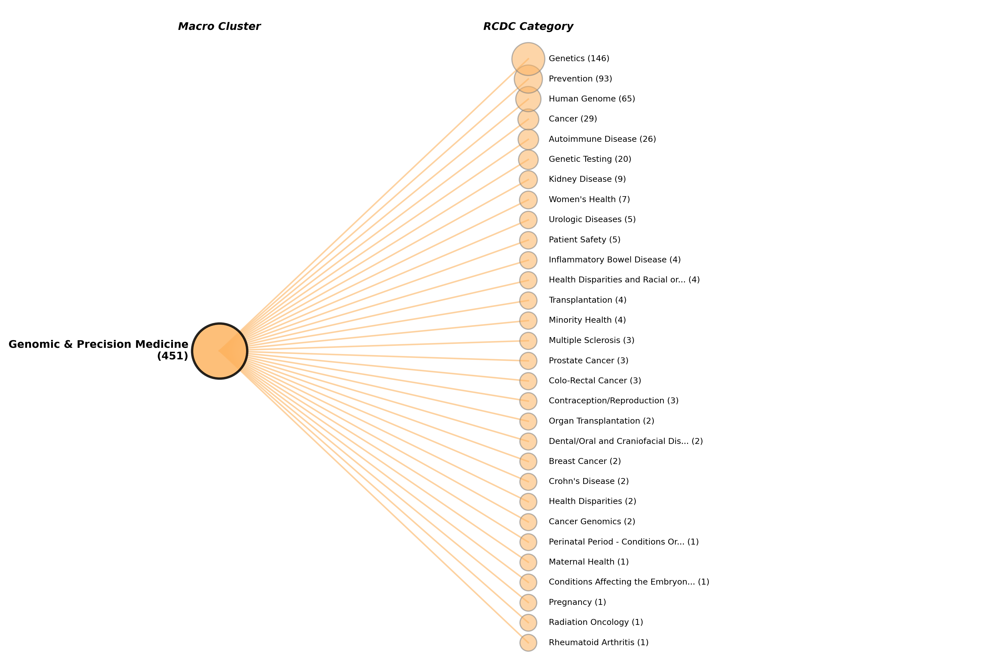

In [291]:
# -----------------------
# Dendrogram-style hierarchical plot: RCDC macro -> original categories
# Two-level hierarchy visualization
# -----------------------
import matplotlib.pyplot as plt
TOP_MACRO = 1
rcdc_rows = []
fig, ax = plt.subplots(figsize=(12, 8))
child_y_spacing = 1.2
macro_code_display = 4

for _, row in df_patent.iterrows():
    macro_topics = row.get('top_level_topics', [])
    raw_topics = row.get(cat_col, [])

    if isinstance(raw_topics, str):
        try:
            raw_topics = ast.literal_eval(raw_topics)
        except Exception:
            raw_topics = []

    if not isinstance(macro_topics, list) or not isinstance(raw_topics, list):
        continue

    for topic in raw_topics:
        if not isinstance(topic, dict):
            continue

        rcdc_id = topic.get('id')
        if rcdc_id is None:
            continue

        rcdc_id_str = str(rcdc_id)
        macro_code = code_to_macro.get(rcdc_id_str, code_to_macro.get(rcdc_id))
        if macro_code is None or macro_code not in macro_topics:
            continue

        rcdc_label = topic.get('name')
        if not rcdc_label:
            rcdc_label = cat_dict.get(rcdc_id_str, cat_dict.get(rcdc_id, f'RCDC {rcdc_id_str}'))

        rcdc_rows.append({
            'macro_code': macro_code,
            'macro_label': macro_cluster_names.get(macro_code, f'Macro {macro_code}'),
            'rcdc_id': rcdc_id_str,
            'rcdc_label': rcdc_label
        })

hier_df_rcdc = pd.DataFrame(rcdc_rows)

if not hier_df_rcdc.empty:
    counts = (
        hier_df_rcdc
        .groupby(['macro_code', 'macro_label', 'rcdc_id', 'rcdc_label'])
        .size()
        .reset_index(name='count')
    )

    
    macro_totals = (
        counts.groupby(['macro_code', 'macro_label'])['count']
        .sum()
        .reset_index()
        .sort_values('count', ascending=False)
        #.head(TOP_MACRO)
    )
    colors = plt.cm.Set3(range(len(macro_totals)))
    
    macro_totals = macro_totals.loc[macro_totals['macro_code']==macro_code_display]  # Filter to macros 
    print(macro_totals)
    
    counts = counts.merge(macro_totals[['macro_code']], on='macro_code', how='inner')
    macro_order = macro_totals['macro_code'].tolist()


    
    macro_colors = colors[macro_code_display+1]

    y_spacing = 1.8
    x_macro = 0
    x_rcdc = 6
    y_current = 0

    for macro_code in macro_order:
        macro_data = counts[counts['macro_code'] == macro_code]
        macro_label = macro_data['macro_label'].iloc[0]
        macro_total = macro_data['count'].sum()

        children = (
            macro_data.groupby(['rcdc_id', 'rcdc_label'])['count']
            .sum()
            .reset_index()
            .sort_values('count', ascending=True)
        )

        n_children = len(children)
        child_y_start = y_current
        
        macro_y = child_y_start + (n_children - 1) * child_y_spacing / 2

        macro_size = min(2200, 500 + macro_total * 6)
        ax.scatter(
            x_macro, macro_y, s=macro_size,
            color=macro_colors, edgecolor='black', linewidth=2,
            zorder=3, alpha=0.85
        )

        ax.text(
            x_macro - 0.6, macro_y,
            f"{macro_label}\n({macro_total})",
            ha='right', va='center', fontsize=9, fontweight='bold'
        )

        for child_idx, (_, child_row) in enumerate(children.iterrows()):
            rcdc_id = child_row['rcdc_id']
            rcdc_label = child_row['rcdc_label']
            rcdc_count = child_row['count']
            child_y = child_y_start + child_idx * child_y_spacing

            ax.plot(
                [x_macro, x_rcdc], [macro_y, child_y],
                color=macro_colors, linewidth=1.3, alpha=0.6, zorder=1
            )

            child_size = min(900, 200 + rcdc_count * 4)
            ax.scatter(
                x_rcdc, child_y, s=child_size,
                color=macro_colors, edgecolor='gray', linewidth=1,
                zorder=2, alpha=0.55
            )

            child_text = rcdc_label if len(rcdc_label) <= 35 else rcdc_label[:32] + '...'
            ax.text(
                x_rcdc + 0.4, child_y,
                f"{child_text} ({rcdc_count})",
                ha='left', va='center', fontsize=7
            )

        y_current += (n_children * child_y_spacing) + y_spacing

    ax.set_xlim(-2, 15)
    ax.set_ylim(-1, y_current)
    ax.set_aspect('auto')
    ax.axis('off')

    ax.text(x_macro, y_current-0.8, 'Macro Cluster', ha='center', va='top', fontsize=9, style='italic', fontweight='bold')
    ax.text(x_rcdc, y_current-0.8, 'RCDC Category', ha='center', va='top', fontsize=9, style='italic', fontweight='bold')

    plt.tight_layout()
    plt.savefig(f'fig/patent/patent_category_hierarchy_rcdc_{macro_code_display}.svg', format='svg')



In [118]:
for _, row in df_patent.iterrows():
    raw_topics = row.get(cat_col, [])
    break
raw_topics

[{'id': '625', 'name': 'Machine Learning and Artificial Intelligence'},
 {'id': '439', 'name': 'Biomedical Imaging'},
 {'id': '623', 'name': 'Data Science'},
 {'id': '541', 'name': 'Networking and Information Technology R&D (NITRD)'}]

In [135]:
import ast
import numpy as np
import pandas as pd
from collections import Counter

dis_codes_per_category = 5
fractional = False

if cat_col == 'category_rcdc':
    # normalize mapping to string ids
    top_topic_dict_str = {
        str(macro_code): {str(topic_id) for topic_id in topic_ids}
        for macro_code, topic_ids in top_topic_dict.items()
    }

    # count occurrences of raw topics, but only under their mapped macro
    macro_topic_counts = {str(macro_code): Counter() for macro_code in macro_cluster_names.keys()}

    for _, row in df_patent.iterrows():
        raw_topics = row.get(cat_col, [])

        if isinstance(raw_topics, str):
            try:
                raw_topics = ast.literal_eval(raw_topics)
            except Exception:
                raw_topics = []

        if not isinstance(raw_topics, list):
            continue
        
        tot_topics = len(raw_topics) if raw_topics else 1
        
        for topic in raw_topics:
            if not isinstance(topic, dict):
                continue

            topic_id = str(topic.get('id'))
            if topic_id is None:
                continue

            # assign topic only to the macro it truly belongs to
            
            for macro_code, allowed_topic_ids in top_topic_dict_str.items():
                if topic_id in allowed_topic_ids:
                    macro_topic_counts[macro_code][topic_id] += 1 if not fractional else 1 / tot_topics
                    break
                    

    # build top-N topics per macro
    heatmap_data = []
    for macro_code, macro_label in macro_cluster_names.items():
        macro_code = str(macro_code)

        top_topics = macro_topic_counts[macro_code].most_common(dis_codes_per_category)

        top_topics_labeled = [
            (cat_dict.get(topic_id, topic_id), count)
            for topic_id, count in top_topics
        ]

        heatmap_data.append((macro_label, top_topics_labeled))

    # build matrix
    rcdc_labels = []
    for _, topics in heatmap_data:
        for topic_label, _ in topics:
            if topic_label not in rcdc_labels:
                rcdc_labels.append(topic_label)

    heatmap_matrix = np.zeros((len(heatmap_data), len(rcdc_labels)))

    for i, (macro_label, topics) in enumerate(heatmap_data):
        for topic_label, count in topics:
            j = rcdc_labels.index(topic_label)
            heatmap_matrix[i, j] = count

    heatmap_df = pd.DataFrame(
        heatmap_matrix,
        index=[m for m, _ in heatmap_data],
        columns=rcdc_labels
    ).T

    # sort rows by owning macro column, then descending count
    col_order = heatmap_df.columns.tolist()
    row_category = heatmap_df.idxmax(axis=1)
    row_value = heatmap_df.max(axis=1)

    sorted_df = (
        heatmap_df.assign(
            _category=row_category,
            _value=row_value,
            _category_order=row_category.map({col: i for i, col in enumerate(col_order)})
        )
        .sort_values(by=["_category_order", "_value"], ascending=[True, False])
        .drop(columns=["_category", "_value", "_category_order"])
    )

    sorted_df = sorted_df.replace(0, np.nan)
    
for macro_code, label in macro_cluster_names.items():
    macro_topic_counts[label]=sum(macro_topic_counts[str(macro_code)].values())

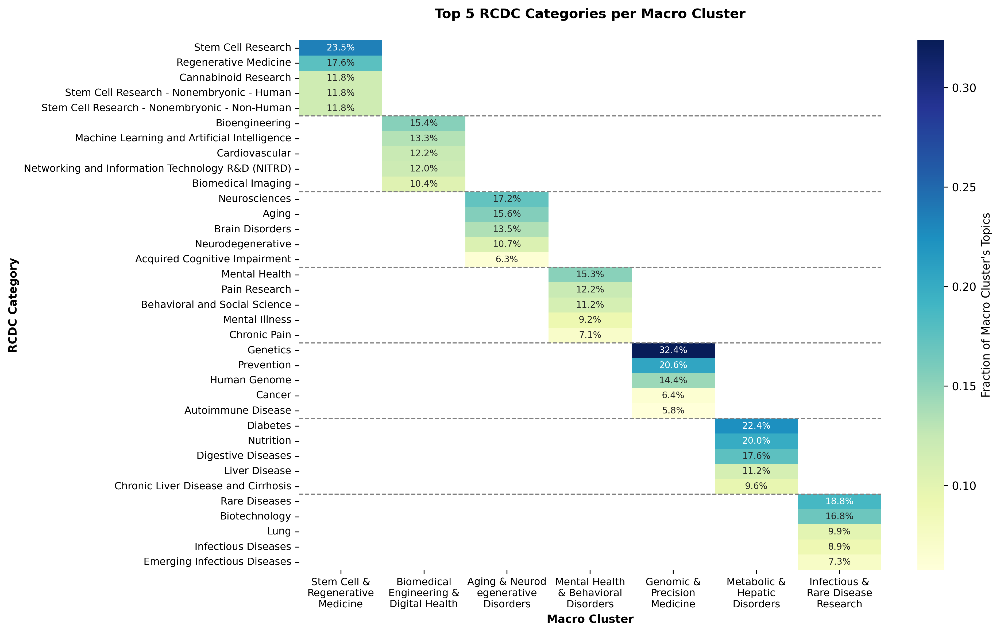

In [248]:
import textwrap
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(13, 8))
normalize = True

dis_df = sorted_df.copy()
if normalize:
    for col in dis_df.columns:
        col_sum = macro_topic_counts[col]
        if col_sum > 0:
            dis_df[col] = dis_df[col] / col_sum

ax = sns.heatmap(dis_df, annot=True, fmt=".1%", cmap="YlGnBu", cbar_kws={"label": "Fraction of Macro Cluster's Topics" if normalize else None}, annot_kws={"size": 8})

# add lines to separate macro clusters
for i in range(5, len(dis_df), 5):
    ax.axhline(i, color="grey", linewidth=1, linestyle="--")

# wrap x tick labels into multiple lines
wrapped_labels = [textwrap.fill(label, width=14) for label in dis_df.columns]
ax.set_xticklabels(wrapped_labels, rotation=0, ha="center", fontsize=9)

ax.set_title("Top 5 RCDC Categories per Macro Cluster", fontsize=12, fontweight="bold", pad=20)
ax.set_ylabel("RCDC Category",fontweight="bold")
ax.set_xlabel("Macro Cluster",fontweight="bold")
ax.set_yticklabels(ax.get_yticklabels(), fontsize=9)

plt.tight_layout()
plt.savefig("fig/patent/rcdc_macro_heatmap.svg", format="svg")

### co-occurrrence of topics 

In [77]:
if cat_col == 'ipcr':
    level='class' # section, class, subclass, or main group
    df_patent['top_level_topics'] = df_patent['topics_list_raw'].apply(lambda topics: ipc_code_to_top_level(topics,level))

    unique_topics = [x for x in set(df_patent['top_level_topics'].explode()) if str(x)!='nan']

    print(unique_topics)
    print(len(unique_topics),'/',len(df_ipc[df_ipc['kind']==level[0]]))
    
    
    topic_short_names_2 = {
    "dyes paints polishes natural resins adhesives compositions not otherwise provided for applications of materials not otherwise provided for":
        "Coatings & Adhesives",

    "electric communication technique":
        "Telecommunications",

    "educating cryptography display advertising seals":
        "Education & Cryptography",

    "optics":
        "Optics",

    "electric elements":
        "Electrical Components",

    "information and communication technology [ict] specially adapted for specific application fields":
        "Applied ICT",

    "combinatorial technology":
        "Combinatorial Technology",

    "agriculture forestry animal husbandry hunting trapping fishing":
        "Agriculture & Forestry",

    "foods, foodstuffs or non-alcoholic beverages preparation, treatment or preservation thereof":
        "Food Processing",

    "sports games amusements":
        "Sports & Entertainment",

    "medical or veterinary science hygiene":
        "Medical & Veterinary Science",

    "computing or calculating counting":
        "Computing & Calculation",

    "measuring testing":
        "Measurement & Testing",

    "biochemistry beer spirits wine vinegar microbiology enzymology mutation or genetic engineering":
        "Biochemistry & Biotechnology",

    "organic chemistry":
        "Organic Chemistry"
}

In [78]:
# -----------------------
# Analyze topic co-occurrence patterns
# -----------------------

import networkx as nx
from itertools import combinations
from collections import Counter

if cat_col == 'ipcr':
    topcode_to_label = ipc_dict
else:
    topcode_to_label = macro_cluster_names
# Extract all topic pairs within each patent
topic_pairs = []
for topics in df_patent['top_level_topics']:
    if len(topics) >= 2:
        # Get unique topic codes
        if not isinstance(topics, list):
            codes = [c for c, _ in topics if c]
        else:
            codes = topics
        unique_codes = list(dict.fromkeys(codes))  # remove duplicates, keep order
        
        # Generate all pairs
        if len(unique_codes) >= 2:
            pairs = list(combinations(sorted(unique_codes), 2))
            topic_pairs.extend(pairs)

# Count pair frequencies
pair_counter = Counter(topic_pairs)

print(f"Total unique topic pairs: {len(pair_counter)}")
print(f"\nTop 20 most frequent topic co-occurrence patterns:")
for (code1, code2), count in pair_counter.most_common(20):
    label1 = topcode_to_label.get(code1, f"Code {code1}")
    label2 = topcode_to_label.get(code2, f"Code {code2}")
    print(f"  {code1} ({label1}) + {code2} ({label2}): {count} patents")

# -----------------------
# Create network visualization
# -----------------------

# Build network graph
G = nx.Graph()

# Add nodes and edges with weights
MIN_CO_OCCUR = 5  # Minimum co-occurrence threshold
for (code1, code2), count in pair_counter.items():
    if count >= MIN_CO_OCCUR:
        G.add_edge(code1, code2, weight=count)

# Get largest connected component for better visualization
if len(G) > 0:
    largest_cc = max(nx.connected_components(G), key=len)
    G = G.subgraph(largest_cc).copy()
    
    print(f"\nNetwork: {len(G.nodes())} topics, {len(G.edges())} co-occurrence links")
    
    # Layout
    pos = nx.spring_layout(G, k=2, iterations=50, seed=175)
    
    # Node sizes based on degree
    node_sizes = [G.degree(node) * 300 + 500 for node in G.nodes()]
    
    # Edge widths based on co-occurrence count
    edge_widths = [G[u][v]['weight'] / 2 for u, v in G.edges()]

Total unique topic pairs: 20

Top 20 most frequent topic co-occurrence patterns:
  1 (Biomedical Engineering & Digital Health) + 4 (Genomic & Precision Medicine): 69 patents
  4 (Genomic & Precision Medicine) + 6 (Infectious & Rare Disease Research ): 53 patents
  2 (Aging & Neurodegenerative Disorders) + 4 (Genomic & Precision Medicine): 46 patents
  1 (Biomedical Engineering & Digital Health) + 2 (Aging & Neurodegenerative Disorders): 35 patents
  4 (Genomic & Precision Medicine) + 5 (Metabolic & Hepatic Disorders): 34 patents
  1 (Biomedical Engineering & Digital Health) + 6 (Infectious & Rare Disease Research ): 23 patents
  2 (Aging & Neurodegenerative Disorders) + 3 (Mental Health & Behavioral Disorders): 23 patents
  2 (Aging & Neurodegenerative Disorders) + 6 (Infectious & Rare Disease Research ): 22 patents
  1 (Biomedical Engineering & Digital Health) + 5 (Metabolic & Hepatic Disorders): 17 patents
  2 (Aging & Neurodegenerative Disorders) + 5 (Metabolic & Hepatic Disorders):

In [79]:
if cat_col == 'category_for':
    pos['52'] = np.array([-0.51188029, -0.61690805])
    pos['46'] = np.array([-0.09916719-0.3, -0.17218727+0.3])
    pos['31'] = np.array([ 0.44840223-0.4, -0.48163047-0.05])
    pos['51'] = np.array([-0.65002732+0.6,  0.47718246])
    pos['34'] = np.array([-0.38881075, -0.3    ])
elif cat_col == 'category_rcdc':
    pos[3] = np.array([-0.2, -0.3])
elif cat_col =='ipcr':
    pass

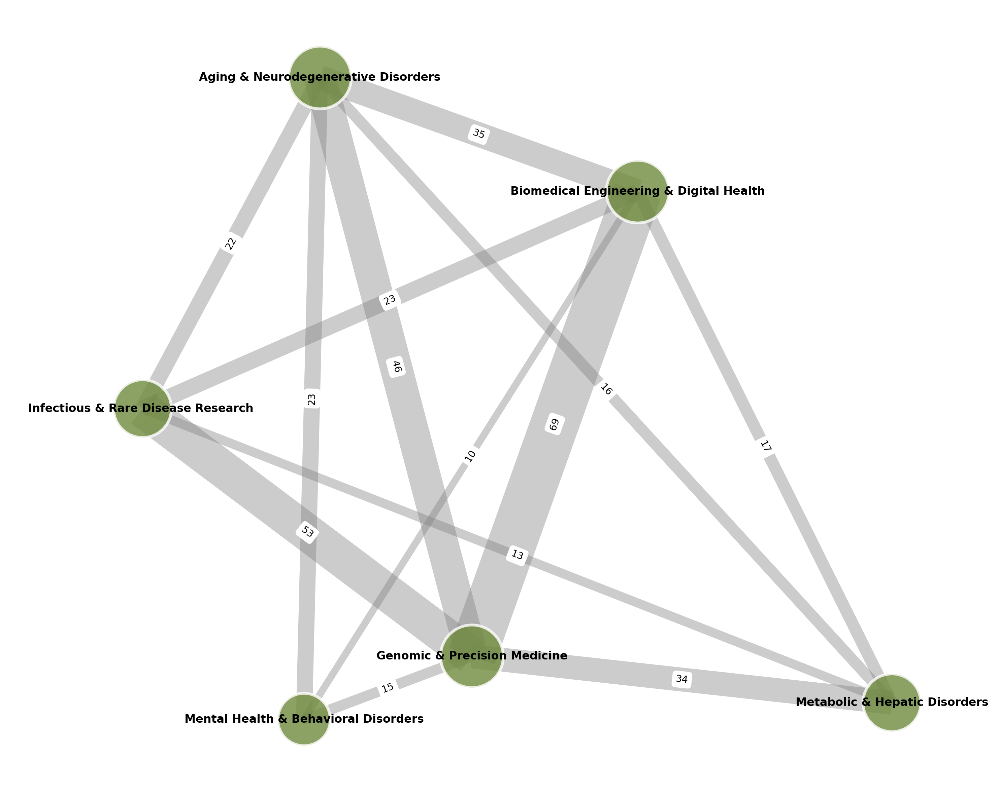


Network Statistics:
  Density: 0.867
  Average clustering coefficient: 0.900
  Number of connected components: 1

Most central topics (by betweenness):
  1 (Biomedical Engineering & Digital Health): 0.067
  2 (Aging & Neurodegenerative Disorders): 0.067
  4 (Genomic & Precision Medicine): 0.067
  6 (Infectious & Rare Disease Research ): 0.000
  5 (Metabolic & Hepatic Disorders): 0.000
No topic pairs found meeting the co-occurrence threshold.


In [80]:

# Create figure
fig, ax = plt.subplots(figsize=(10, 8))

# Draw edges
nx.draw_networkx_edges(
    G, pos, width=edge_widths, alpha=0.4, 
    edge_color='gray', ax=ax
)

# Draw nodes
nx.draw_networkx_nodes(
    G, pos, 
    node_size=node_sizes, 
    node_color=colors_scheme[2],
    alpha=0.8,
    edgecolors='white',
    linewidths=2,
    ax=ax
)

# Draw labels - lookup from topcode_to_label dict instead of node attributes
labels = {node: topcode_to_label.get(node, f"Code {node}") for node in G.nodes()}
for key,val in labels.items():
    if len(val)>display_chars:
        labels[key]=' '.join(val[0:display_chars].split(' ')[:-1])+'...'
    
nx.draw_networkx_labels(
    G, pos, labels, 
    font_size=8, 
    font_weight='bold',
    ax=ax
)

# Draw edge labels (co-occurrence counts)
edge_labels = {(u, v): G[u][v]['weight'] for u, v in G.edges()}
nx.draw_networkx_edge_labels(
    G, pos, edge_labels,
    font_size=7, ax=ax
)


if cat_col =='ipcr':
    ax.set_xlim(-1.5, 1.2)
else:
    ax.set_xlim(-0.8, 1.2)
ax.axis('off')
plt.tight_layout()
plt.show()

# Additional network statistics
print("\nNetwork Statistics:")
print(f"  Density: {nx.density(G):.3f}")
print(f"  Average clustering coefficient: {nx.average_clustering(G):.3f}")
print(f"  Number of connected components: {nx.number_connected_components(G)}")

# Find most central topics
betweenness = nx.betweenness_centrality(G)
print(f"\nMost central topics (by betweenness):")
for node, centrality in sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:5]:
    print(f"  {node} ({topcode_to_label.get(node, f'Code {node}')}): {centrality:.3f}")
else:
    print("No topic pairs found meeting the co-occurrence threshold.")

In [81]:
# -----------------------
# Analyze self-sustaining topics (single-topic and dominant patterns)
# -----------------------

# Count patents by number of topics
topic_counts = df_patent['top_level_topics'].apply(lambda x: len(x) if x else 0)
print("Patents by number of topics:")
print(topic_counts.value_counts().sort_index())
print(f"\nTotal patents: {len(df_patent)}")

# Single-topic patents
single_topic_patents = df_patent[topic_counts == 1]
print(f"\n{'='*60}")
print(f"Single-topic patents: {len(single_topic_patents)} ({100*len(single_topic_patents)/len(df_patent):.1f}%)")
print(f"{'='*60}")

# Get topic distribution among single-topic patents
single_topic_codes = []
for topics in single_topic_patents['top_level_topics']:
    if not isinstance(topics, list):
        single_topic_codes.extend([c for c, _ in topics])
    else:
        single_topic_codes.extend(topics)

from collections import Counter
single_topic_counter = Counter(single_topic_codes)
print("\nTop single topics:")
for code, count in single_topic_counter.most_common():
    label = topcode_to_label.get(code, f"Code {code}")
    print(f"  {code} ({label}): {count} patents")

# Patents with 2+ topics
multi_topic_patents = df_patent[topic_counts >= 2]
print(f"\n{'='*60}")
print(f"Multi-topic patents: {len(multi_topic_patents)} ({100*len(multi_topic_patents)/len(df_patent):.1f}%)")
print(f"{'='*60}")

# Check if any patents have duplicate topic codes (same topic appearing multiple times)
print("\nPatents with duplicate topic codes:")
duplicate_count = 0
for topics in df_patent['top_level_topics']:
    if not isinstance(topics, list):
        single_topic_codes.extend([c for c, _ in topics])
    else:
        single_topic_codes.extend(topics)
    if len(topics) != len(set(topics)):  # duplicates exist
        duplicate_count += 1

print(f"  {duplicate_count} patents have duplicate topic codes")

# Most dominant single-topic
if len(single_topic_counter) > 0:
    top_single = single_topic_counter.most_common(1)[0]
    print(f"\nMost self-sustaining topic (appears alone most often):")
    print(f"  {top_single[0]} ({topcode_to_label.get(top_single[0], f'Code {top_single[0]}')}): {top_single[1]} patents alone")


Patents by number of topics:
top_level_topics
0     95
1    209
2    147
3     48
4     11
5      3
Name: count, dtype: int64

Total patents: 513

Single-topic patents: 209 (40.7%)

Top single topics:
  4 (Genomic & Precision Medicine): 85 patents
  1 (Biomedical Engineering & Digital Health): 60 patents
  2 (Aging & Neurodegenerative Disorders): 29 patents
  6 (Infectious & Rare Disease Research ): 18 patents
  5 (Metabolic & Hepatic Disorders): 13 patents
  3 (Mental Health & Behavioral Disorders): 2 patents
  0 (Stem Cell & Regenerative Medicine): 2 patents

Multi-topic patents: 209 (40.7%)

Patents with duplicate topic codes:
  0 patents have duplicate topic codes

Most self-sustaining topic (appears alone most often):
  4 (Genomic & Precision Medicine): 85 patents alone


In [83]:

# Count how many patents have each topic code (L2) at least once
print("\n" + "="*60)
print("Topic code frequency (in all patents):")
print("="*60)

all_codes = []
for topics in df_patent['top_level_topics']:
    if topics:
        if not isinstance(topics, list):
            codes = [c for c, _ in topics]
        else:
            codes = topics
        all_codes.extend(set(codes))  # unique per patent

topic_frequency = Counter(all_codes)
for code, count in topic_frequency.most_common():
    label = topcode_to_label.get(code, f"Code {code}")
    pct = 100 * count / len(df_patent)
    print(f"  {code} ({label}): {count} patents ({pct:.1f}%)")

# Check which topics appear in multi-topic patents only
print("\n" + "="*60)
print("Topics that appear ONLY in multi-topic patents:")
print("="*60)
multi_all_codes = []
for topics in multi_topic_patents['top_level_topics']:
    if topics:
        if not isinstance(topics, list):
            codes = [c for c, _ in topics]
        else:
            codes = topics
        multi_all_codes.extend(set(codes))

multi_topic_frequency = Counter(multi_all_codes)
for code, count in multi_topic_frequency.most_common():
    label = topcode_to_label.get(code, f"Code {code}")
    pct = 100 * count / len(multi_topic_patents)
    print(f"  {code} ({label}): {count} multi-topic patents ({pct:.1f}%)")



Topic code frequency (in all patents):
  4 (Genomic & Precision Medicine): 235 patents (45.8%)
  1 (Biomedical Engineering & Digital Health): 163 patents (31.8%)
  2 (Aging & Neurodegenerative Disorders): 120 patents (23.4%)
  6 (Infectious & Rare Disease Research ): 91 patents (17.7%)
  5 (Metabolic & Hepatic Disorders): 62 patents (12.1%)
  3 (Mental Health & Behavioral Disorders): 30 patents (5.8%)
  0 (Stem Cell & Regenerative Medicine): 5 patents (1.0%)

Topics that appear ONLY in multi-topic patents:
  4 (Genomic & Precision Medicine): 150 multi-topic patents (71.8%)
  1 (Biomedical Engineering & Digital Health): 103 multi-topic patents (49.3%)
  2 (Aging & Neurodegenerative Disorders): 91 multi-topic patents (43.5%)
  6 (Infectious & Rare Disease Research ): 73 multi-topic patents (34.9%)
  5 (Metabolic & Hepatic Disorders): 49 multi-topic patents (23.4%)
  3 (Mental Health & Behavioral Disorders): 28 multi-topic patents (13.4%)
  0 (Stem Cell & Regenerative Medicine): 3 multi-

In [188]:
# -----------------------
# Analyze division self-sustainability
# -----------------------

# Count unique divisions (L2 codes) per patent
def get_unique_divisions(topics):
    if not topics:
        return set()
       
    if not isinstance(topics, list):
        codes = [c for c, _ in topics]
    else:
        codes = topics
    return set(codes)

division_counts = df_patent['top_level_topics'].apply(lambda x: len(get_unique_divisions(x)))

print("Patents by number of unique divisions (L2 codes):")
print(division_counts.value_counts().sort_index())
print(f"\nTotal patents: {len(df_patent)}")

# Single-division patents
single_div_patents = df_patent[division_counts == 1]
print(f"\n{'='*60}")
print(f"Single-division patents: {len(single_div_patents)} ({100*len(single_div_patents)/len(df_patent):.1f}%)")
print(f"{'='*60}")

# Get division distribution among single-division patents
single_div_codes = []
for topics in single_div_patents['top_level_topics']:
    if topics:
        if not isinstance(topics, list):
            codes = [c for c, _ in topics]
        else:
            codes = topics
        single_div_codes.extend(codes)

single_div_counter = Counter(single_div_codes)
print("\nDivisions appearing alone (all topics from same division):")
for code, count in single_div_counter.most_common():
    label = topcode_to_label.get(code, f"Code {code}")
    pct = 100 * count / len(df_patent)
    print(f"  {code} ({label}): {count} patents ({pct:.1f}%)")

# Multi-division patents
multi_div_patents = df_patent[division_counts >= 2]
print(f"\n{'='*60}")
print(f"Multi-division patents: {len(multi_div_patents)} ({100*len(multi_div_patents)/len(df_patent):.1f}%)")
print(f"{'='*60}")

# Show example of single-division patent
if len(single_div_patents) > 0:
    print(f"\nExample single-division patent:")
    sample = single_div_patents.iloc[0]
    print(f"  Topics: {sample['top_level_topics']}")
    print(f"  Number of L4 codes: {len(sample['top_level_topics'])}")

# Show example of multi-division patent
if len(multi_div_patents) > 0:
    print(f"\nExample multi-division patent:")
    sample = multi_div_patents.iloc[0]
    print(f"  Topics: {sample['top_level_topics']}")
    print(f"  Number of divisions: {len(get_unique_divisions(sample['top_level_topics']))}")


Patents by number of unique divisions (L2 codes):
top_level_topics
0      5
1    241
2    220
3     43
4      4
Name: count, dtype: int64

Total patents: 513

Single-division patents: 241 (47.0%)

Divisions appearing alone (all topics from same division):
  A61 (medical or veterinary science hygiene): 234 patents (45.6%)
  G16 (information and communication technology [ict] specially adapted for specific application fields): 199 patents (38.8%)
  C12 (biochemistry beer spirits wine vinegar microbiology enzymology mutation or genetic engineering): 159 patents (31.0%)
  G06 (computing or calculating counting): 82 patents (16.0%)
  G01 (measuring testing): 49 patents (9.6%)
  C07 (organic chemistry): 21 patents (4.1%)
  G09 (educating cryptography display advertising seals): 2 patents (0.4%)
  H04 (electric communication technique): 1 patents (0.2%)
  A01 (agriculture forestry animal husbandry hunting trapping fishing): 1 patents (0.2%)

Multi-division patents: 267 (52.0%)

Example single

## patent topics by country

In [47]:
# -----------------------
# Analyze topics by countries (with fractional counting)
# -----------------------

# Parse all countries from assignee_countries with fractional weighting
import ast

def extract_all_countries(val):
    """Extract all country ISO codes from assignee_countries"""
    try:
        if val is None:
            return []
        if isinstance(val, str):
            try:
                val = ast.literal_eval(val)
            except:
                return []
        if isinstance(val, list) and len(val) > 0:
            countries = []
            for item in val:
                if isinstance(item, dict) and 'id' in item:
                    countries.append(item['id'])
                elif isinstance(item, str):
                    countries.append(item)
            return countries
    except:
        pass
    return []

df_patent['country_list'] = df_patent['assignee_countries'].apply(extract_all_countries)

# Filter patents with country data
df_with_country = df_patent[df_patent['country_list'].apply(len) > 0].copy()
print(f"Parsing countries from 'assignee_countries' column with fractional weighting")
print(f"\nPatents with country data: {len(df_with_country)} ({100*len(df_with_country)/len(df_patent):.1f}%)")

# Calculate fractional country counts
fractional_country_counts = {}
for idx, row in df_with_country.iterrows():
    countries = row['country_list']
    if len(countries) > 0:
        weight = 1.0 / len(countries)
        for country in countries:
            fractional_country_counts[country] = fractional_country_counts.get(country, 0) + weight

# Sort by count
country_counts_frac = dict(sorted(fractional_country_counts.items(), key=lambda x: x[1], reverse=True))

print(f"\nTop 10 countries by fractional patent count:")
for i, (country, count) in enumerate(list(country_counts_frac.items())[:10]):
    print(f"  {country}: {count:.2f} patents")

Parsing countries from 'assignee_countries' column with fractional weighting

Patents with country data: 487 (94.9%)

Top 10 countries by fractional patent count:
  US: 237.70 patents
  GB: 60.00 patents
  CN: 28.00 patents
  KR: 26.00 patents
  DE: 21.50 patents
  FR: 19.30 patents
  JP: 13.00 patents
  BE: 10.17 patents
  CH: 9.50 patents
  IE: 9.00 patents


In [72]:
if cat_col == 'ipcr':
    topcode_to_label = ipc_dict
elif cat_col == 'category_rcdc':
    topcode_to_label = macro_cluster_names

In [ ]:
# -----------------------
# Topic distribution by country (fractional weighting)
# -----------------------

# Build country-topic matrix with fractional counts
country_topic_data = []
for idx, row in df_with_country.iterrows():
    countries = row['country_list']
    topics = row['top_level_topics']
    
    if topics and len(countries) > 0:
        if isinstance(topics, list):
            unique_codes = set(topics)
        else:
            unique_codes = set(c for c, _ in topics)
        weight = 1.0 / len(countries)  # Fractional weight per country
        
        for country in countries:
            for code in unique_codes:
                country_topic_data.append({
                    'country': country,
                    'topic_code': code,
                    'topic_label': topcode_to_label.get(code, f"Code {code}"),
                    'weight': weight
                })

df_country_topic = pd.DataFrame(country_topic_data)

# Sum fractional counts per country-topic pair
topic_by_country = df_country_topic.groupby(['country', 'topic_code', 'topic_label'])['weight'].sum().reset_index(name='count')

# Get top 8 countries for visualization (by fractional count)
top_countries = sorted(country_counts_frac.items(), key=lambda x: x[1], reverse=True)[:8]
top_countries = [country for country, _ in top_countries]

# Filter to top countries and top topics
df_viz = topic_by_country[topic_by_country['country'].isin(top_countries)].copy()

# Get top 8 topics globally
top_topics_global = topic_frequency.most_common(8)

top_topic_codes = [code for code, _ in top_topics_global]

df_viz = df_viz[df_viz['topic_code'].isin(top_topic_codes)]

# Pivot for heatmap
pivot_country_topic = df_viz.pivot_table(
    index='topic_code', 
    columns='country', 
    values='count', 
    fill_value=0
)

# Reorder by top topics
pivot_country_topic = pivot_country_topic.loc[top_topic_codes]

# Reorder columns by top countries
pivot_country_topic = pivot_country_topic[top_countries]

pivot_country_topic.rename(columns={'GB':'UK'}, inplace=True)

In [74]:
# set the dpi of matplotlib figures
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 400

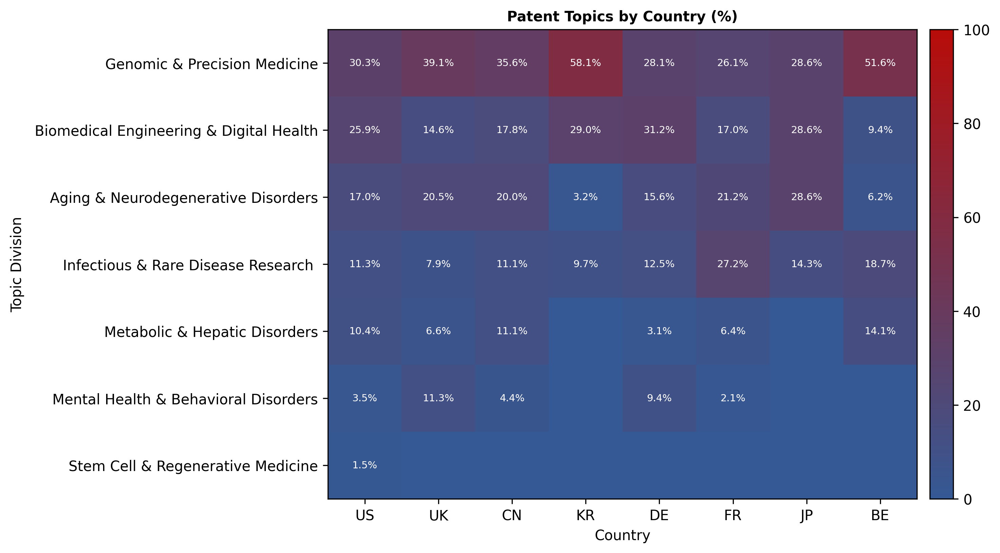

In [75]:
from matplotlib.colors import LinearSegmentedColormap

fig, ax = plt.subplots(1,1, figsize=(8,6))

# 1. Heatmap of country-topic matrix (normalized by country)


# Normalize by country (each column sums to 1)
pivot_normalized = pivot_country_topic.div(pivot_country_topic.sum(axis=0), axis=1) * 100

# creat a camp from colors we have defined colors_scheme[2] and colors_scheme[4]

cmap = LinearSegmentedColormap.from_list(
    "custom_cmap",
    [colors_scheme[3], colors_scheme[0]]
)

im = ax.imshow(pivot_normalized.values, cmap=cmap, aspect='auto', vmin=0, vmax=100)

# Set ticks and labels
ax.set_xticks(range(len(pivot_normalized.columns)))
ax.set_yticks(range(len(pivot_normalized.index)))
ax.set_xticklabels(pivot_normalized.columns, rotation=0, ha='center')
y_ticklabels = [f" {topcode_to_label.get(code, code)}" for code in pivot_normalized.index]
if cat_col == 'ipcr':
    if level =='class':
        y_ticklabels = [topic_short_names_2.get(label.lower()[1:], label) for label in y_ticklabels]
        y_ticklabels = [x if len(x) <= display_chars else x[:display_chars] + "..." for x in y_ticklabels]
elif cat_col == 'category_rcdc':
    y_ticklabels = [cat_dict.get(label, label) for label in y_ticklabels]
    #y_ticklabels = [x if len(x) <= display_chars else x[:display_chars] + "..." for x in y_ticklabels]
ax.set_yticklabels(y_ticklabels)

# Add values in cells
for i in range(len(pivot_normalized.index)):
    for j in range(len(pivot_normalized.columns)):
        val = pivot_normalized.values[i, j]
        if val > 0:
            text_color = 'white' #if val > 50 else 'black'
            ax.text(j, i, f'{val:.1f}%', ha='center', va='center', 
                   color=text_color,fontsize=7)

ax.set_title('Patent Topics by Country (%)', fontsize=10, fontweight='bold')
ax.set_xlabel('Country')
ax.set_ylabel('Topic Division')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02, fraction=0.046)
cbar.set_label('', rotation=270, labelpad=15)


In [84]:
pivot_country_topic

country,US,UK,CN,KR,DE,FR,JP,BE
topic_code,,,,,,,,
4,98.7,29.5,16.0,18.0,9.0,12.3,2.0,5.500000
1,84.5,11.0,8.0,9.0,10.0,8.0,2.0,1.000000
2,55.5,15.5,9.0,1.0,5.0,10.0,2.0,0.666667
6,36.7,6.0,5.0,3.0,4.0,12.8,1.0,2.000000
5,34.0,5.0,5.0,0.0,1.0,3.0,0.0,1.500000
3,11.5,8.5,2.0,0.0,3.0,1.0,0.0,0.000000
0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


In [ ]:
from matplotlib.colors import LinearSegmentedColormap

fig, ax = plt.subplots(1,1, figsize=(8,6))

# 1. Heatmap of country-topic matrix (normalized by country)


# Normalize by country (each column sums to 1)
pivot_normalized = pivot_country_topic.div(pivot_country_topic.sum(axis=0), axis=1) * 100

# creat a camp from colors we have defined colors_scheme[2] and colors_scheme[4]

cmap = LinearSegmentedColormap.from_list(
    "custom_cmap",
    [colors_scheme[3], colors_scheme[0]]
)

im = ax.imshow(pivot_normalized.values, cmap=cmap, aspect='auto', vmin=0, vmax=100)

# Set ticks and labels
ax.set_xticks(range(len(pivot_normalized.columns)))
ax.set_yticks(range(len(pivot_normalized.index)))
ax.set_xticklabels(pivot_normalized.columns, rotation=0, ha='center')
y_ticklabels = [f" {topcode_to_label.get(code, code)}" for code in pivot_normalized.index]
if cat_col == 'ipcr':
    if level =='class':
        y_ticklabels = [topic_short_names_2.get(label.lower()[1:], label) for label in y_ticklabels]
        y_ticklabels = [x if len(x) <= display_chars else x[:display_chars] + "..." for x in y_ticklabels]
elif cat_col == 'category_rcdc':
    y_ticklabels = [cat_dict.get(label, label) for label in y_ticklabels]
    #y_ticklabels = [x if len(x) <= display_chars else x[:display_chars] + "..." for x in y_ticklabels]
ax.set_yticklabels(y_ticklabels)

# Add values in cells
for i in range(len(pivot_normalized.index)):
    for j in range(len(pivot_normalized.columns)):
        val = pivot_normalized.values[i, j]
        if val > 0:
            text_color = 'white' #if val > 50 else 'black'
            ax.text(j, i, f'{val:.1f}%', ha='center', va='center', 
                   color=text_color,fontsize=7)

ax.set_title('Patent Topics by Country (%)', fontsize=10, fontweight='bold')
ax.set_xlabel('Country')
ax.set_ylabel('Topic Division')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02, fraction=0.046)
cbar.set_label('', rotation=270, labelpad=15)


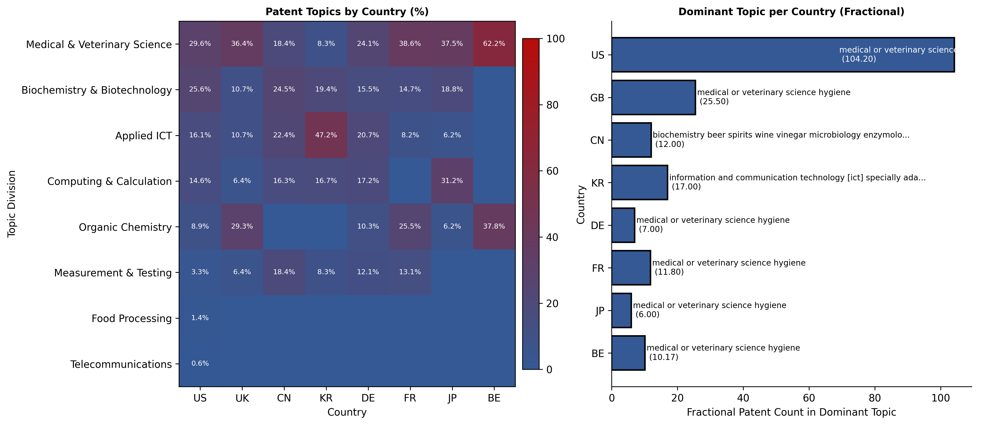

In [200]:
# -----------------------
# Visualize topics by countries
# -----------------------
from matplotlib.colors import LinearSegmentedColormap

fig, axes = plt.subplots(1,2, figsize=(14,6))

# 1. Heatmap of country-topic matrix (normalized by country)
ax = axes[0]

# Normalize by country (each column sums to 1)
pivot_normalized = pivot_country_topic.div(pivot_country_topic.sum(axis=0), axis=1) * 100

# creat a camp from colors we have defined colors_scheme[2] and colors_scheme[4]

cmap = LinearSegmentedColormap.from_list(
    "custom_cmap",
    [colors_scheme[3], colors_scheme[0]]
)

im = ax.imshow(pivot_normalized.values, cmap=cmap, aspect='auto', vmin=0, vmax=100)

# Set ticks and labels
ax.set_xticks(range(len(pivot_normalized.columns)))
ax.set_yticks(range(len(pivot_normalized.index)))
ax.set_xticklabels(pivot_normalized.columns, rotation=0, ha='center')
y_ticklabels = [f" {topcode_to_label.get(code, code)}" for code in pivot_normalized.index]
y_ticklabels = [topic_short_names_2.get(label.lower()[1:], label) for label in y_ticklabels]
y_ticklabels = [x if len(x) <= display_chars else x[:display_chars] + "..." for x in y_ticklabels]
ax.set_yticklabels(y_ticklabels)

# Add values in cells
for i in range(len(pivot_normalized.index)):
    for j in range(len(pivot_normalized.columns)):
        val = pivot_normalized.values[i, j]
        if val > 0:
            text_color = 'white' #if val > 50 else 'black'
            ax.text(j, i, f'{val:.1f}%', ha='center', va='center', 
                   color=text_color,fontsize=7)

ax.set_title('Patent Topics by Country (%)', fontsize=10, fontweight='bold')
ax.set_xlabel('Country')
ax.set_ylabel('Topic Division')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02, fraction=0.046)
cbar.set_label('', rotation=270, labelpad=15)



# 3. Top topic per country (dominant topic)
ax = axes[1]
dominant_topics = []
dominant_counts = []
dominant_colors = []

for country in top_countries:
    country_data = topic_by_country[topic_by_country['country'] == country]
    top_topic = country_data.nlargest(1, 'count').iloc[0]
    dominant_topics.append(f"{top_topic['topic_code']}")
    dominant_counts.append(top_topic['count'])
    dominant_colors.append(colors_scheme[3])

bars = ax.barh(top_countries, dominant_counts, color=dominant_colors, 
               edgecolor='black', linewidth=1.5)
ax.set_xlabel('Fractional Patent Count in Dominant Topic')
ax.set_ylabel('Country')
ax.set_title('Dominant Topic per Country (Fractional)', fontsize=10, fontweight='bold')
ax.invert_yaxis()

# Add topic labels on bars
for i, (bar, topic, count) in enumerate(zip(bars, dominant_topics, dominant_counts)):
    topic_label = topcode_to_label.get(topic, topic)
    if len(topic_label)>display_chars:
        topic_label = topic_label[:display_chars] + "..."
    if i == 0:
        ax.text(count-35, bar.get_y() + bar.get_height()/2, 
                f'{topic_label}\n ({count:.2f})', 
                va='center',  fontsize=8, color="white")
    else:
        ax.text(count + 0.5, bar.get_y() + bar.get_height()/2, 
                f'{topic_label}\n ({count:.2f})', 
                va='center',  fontsize=8)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.tight_layout()
plt.show()


### assembled patent graphs 


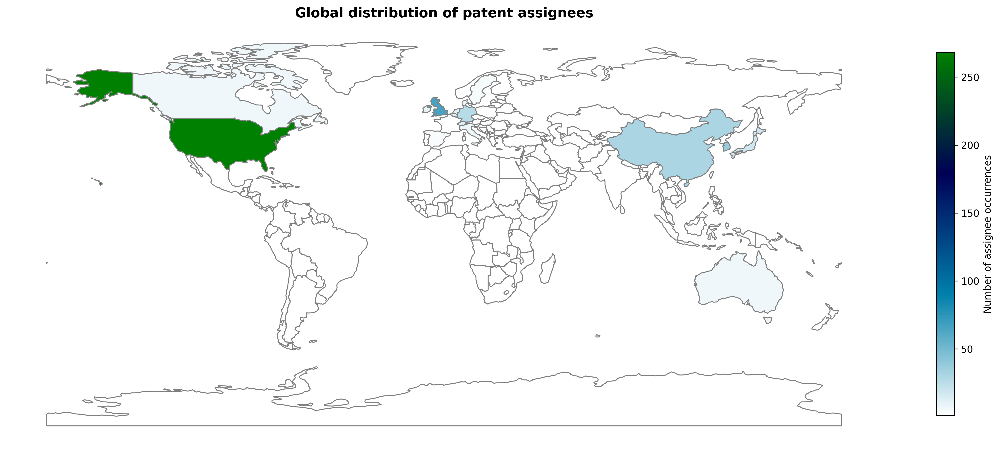

In [209]:
fig, ax = plt.subplots(1, 1, figsize=(16, 9))
world_patents.plot(
    column='count',
    ax=ax,
    legend=True,
    cmap='ocean_r',
    edgecolor='grey',
    missing_kwds={
        "color": "white",
        "label": "No patents"
    },
    legend_kwds={
        'label': "Number of assignee occurrences",
        'shrink': 0.6
    }
)

ax.set_title('Global distribution of patent assignees', fontsize=14, fontweight='bold')
ax.axis('off')
plt.tight_layout()

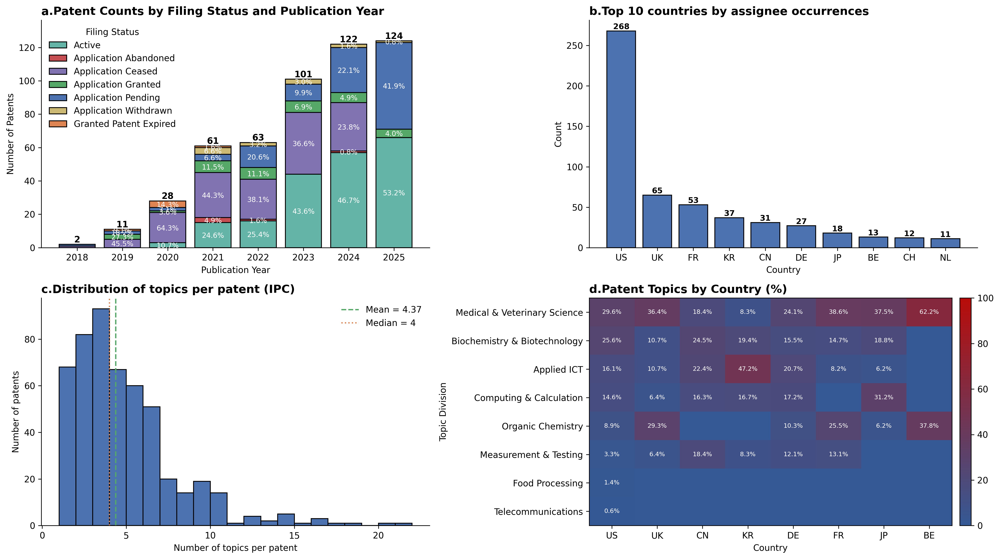

In [226]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap



title_fontsize = 13
fig, axes = plt.subplots(2,2, figsize=(16, 9))



# first plot: patent counts by legal status and publication year
ax = axes[0,0]

# plot


bottom = None
for status in pivot_df.columns:
    values = pivot_df[status]
    bars = ax.bar(
        pivot_df.index,
        values,
        bottom=bottom,
        label=status,
        color=status_colors.get(status, None),
         edgecolor='black', linewidth=1)
        #color=colors_scheme[pivot_df.columns.get_loc(status)+2]
    

    # percentage annotations
    for year, bar, value in zip(pivot_df.index, bars, values):
        if value > 0 and totals.loc[year] > 2:
            pct = value / totals.loc[year] * 100
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_y() + value / 2-0.5,
                f'{pct:.1f}%',
                ha='center',
                va='center',
                fontsize=8,
                color ='white'
            )

    bottom = values if bottom is None else bottom + values

# annotate total counts on top of bars
for year in pivot_df.index:
    ax.text(
        year,
        totals.loc[year],
        f'{int(totals.loc[year])}',
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

# labels & styling
ax.set_xlabel('Publication Year')
ax.set_ylabel('Number of Patents')
ax.set_title('a.Patent Counts by Filing Status and Publication Year', fontsize=title_fontsize, fontweight='bold',loc='left')
ax.legend(title='Filing Status',frameon=False, loc='upper left')
ax.set_ylim(0, totals.max() * 1.1)  # add some headroom for annotations
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


# world map of patent assignees (fractional counting)
ax = axes[0,1]

counts_df = country_df[['iso2', 'count']].copy()
counts_df.replace({'iso2': {'GB': 'UK'}}, inplace=True)  # rename GB to UK for consistency with UKBB data
#Normalize counts by country totals 
""" 
for idx, row in counts_df.iterrows():
    if row['iso2'] in country_count_ukbb_cleaned.keys():
        counts_df.at[idx, 'count'] /= country_count_ukbb_cleaned[row['iso2']]
"""
#plot_bar_matplotlib(counts_df, top_n=10, savefile='fig/patent/patent_countries_bar.png')


top_n = 10
df = counts_df.sort_values('count', ascending=False).head(top_n).copy()
ax.bar(df['iso2'], df['count'], color="#4C72B0", edgecolor='black', linewidth=1)
# add annotations
for i, row in df.iterrows():
    ax.text(row['iso2'], row['count'], f"{row['count']}", ha='center', va='bottom',fontsize=9,fontweight='bold')
ax.set_xlabel('Country')
ax.set_ylabel('Count')
ax.set_title('b.Top {} countries by assignee occurrences'.format(min(top_n, len(df))), fontsize=title_fontsize, fontweight='bold',loc='left')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax = axes[1,0]
ax.hist(
    df_patent['n_topics'],
    bins=range(1, df_patent['n_topics'].max() + 2),
    edgecolor='black',
    color="#4C72B0"
)
ax.axvline(avg_topics, linestyle='--', label=f'Mean = {avg_topics:.2f}',color ="#55A868")
ax.axvline(median_topics, linestyle=':', label=f'Median = {median_topics:.0f}',color ="#DD8452")

# add legend for the vertical lines
ax.legend(frameon=False)

ax.set_xlabel('Number of topics per patent')
ax.set_ylabel('Number of patents')
ax.set_title(f'c.Distribution of topics per patent ({cat_col.replace("category_", "").replace("ipcr", "IPC")})', fontsize=title_fontsize, fontweight='bold',loc='left')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)



# 4. Heatmap of country-topic matrix (normalized by country)

ax = axes[1,1]
# Normalize by country (each column sums to 1)
pivot_normalized = pivot_country_topic.div(pivot_country_topic.sum(axis=0), axis=1) * 100

# creat a camp from colors we have defined colors_scheme[2] and colors_scheme[4]

cmap = LinearSegmentedColormap.from_list(
    "custom_cmap",
    [colors_scheme[3], colors_scheme[0]]
)

im = ax.imshow(pivot_normalized.values, cmap=cmap, aspect='auto', vmin=0, vmax=100)

# Set ticks and labels
ax.set_xticks(range(len(pivot_normalized.columns)))
ax.set_yticks(range(len(pivot_normalized.index)))
ax.set_xticklabels(pivot_normalized.columns, rotation=0, ha='center')
y_ticklabels = [f" {topcode_to_label.get(code, code)}" for code in pivot_normalized.index]
if level =='class':
    y_ticklabels = [topic_short_names_2.get(label.lower()[1:], label) for label in y_ticklabels]
y_ticklabels = [x if len(x) <= display_chars else x[:display_chars] + "..." for x in y_ticklabels]
ax.set_yticklabels(y_ticklabels)

# Add values in cells
for i in range(len(pivot_normalized.index)):
    for j in range(len(pivot_normalized.columns)):
        val = pivot_normalized.values[i, j]
        if val > 0:
            text_color = 'white' #if val > 50 else 'black'
            ax.text(j, i, f'{val:.1f}%', ha='center', va='center', 
                   color=text_color,fontsize=7)

ax.set_title('d.Patent Topics by Country (%)', fontsize=title_fontsize, fontweight='bold',loc='left')
ax.set_xlabel('Country')
ax.set_ylabel('Topic Division')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02, fraction=0.046)
cbar.set_label('', rotation=270, labelpad=15)



plt.tight_layout()
plt.show()

# proteomics 

In [11]:
# preprocess  the title and abstract 
df_patent['abstract'] = df_patent['abstract'].fillna('').str.lower()
df_patent['title'] = df_patent['title'].fillna('').str.lower()

In [17]:
proteomics_keywords = [
    "proteomics", "proteome", "mass spectrometry", "lc-ms",
    "protein profiling", "protein quantification",
    "protein biomarker", "post-translational modification",
    "ptm", "phosphoproteomics", "interactome"
]

pattern = "|".join(proteomics_keywords)

df_patent["kw_flag"] = df_patent["abstract"].str.contains(
    pattern, case=False, regex=True
)

## by LLM models 

In [14]:
import ollama 

client = ollama.Client()

model = "llama3.1:8b"


In [30]:
PROTEOMICS_PROMPT_TEMPLATE = """
You are an expert in biomedical research and patent analysis.

Task:
Determine whether the following patent is related to PROTEOMICS.

Definition:
A patent is proteomics-related if it primarily concerns large-scale analysis,
identification, quantification, modification, or functional characterization
of proteins. This includes, for example:
- mass spectrometry–based proteomics
- protein biomarkers discovered at scale
- proteome-wide association studies
- protein interaction networks
- post-translational modification profiling

Exclude:
- patents focused only on a single protein as a drug target
- general genomics or transcriptomics without protein-level analysis
- purely therapeutic compositions without proteomic methodology

Output strictly in valid JSON with the following keys:
{{"label": "yes" or "no", "confidence": "high" | "medium" | "low", "rationale": "1-2 sentence explanation"}}

Patent abstract:
<<<
{abstract}
>>>
"""

In [170]:
import re
import pandas as pd
from bs4 import BeautifulSoup

def clean_patent_abstract(text: str) -> str:
    if pd.isna(text):
        return text

    s = str(text)

    # --- 1) Repair some common malformed tag patterns seen in scraped patents
    # Example: (c<sub>4</sub>-c<sub>6)</sub>  -> try to fix the "6)" inside sub
    s = re.sub(r'<sub>(\d+)\)</sub>', r'<sub>\1</sub>)', s)

    # --- 2) Convert <sub> and <sup> to explicit plain-text markers BEFORE stripping tags
    # r<sup>1</sup> -> r^1
    s = re.sub(r'<sup>\s*([^<]+?)\s*</sup>', r'^\1', s, flags=re.IGNORECASE)
    # c<sub>4</sub> -> c_4
    s = re.sub(r'<sub>\s*([^<]+?)\s*</sub>', r'_\1', s, flags=re.IGNORECASE)

    # --- 3) Strip remaining HTML/XML tags safely
    s = BeautifulSoup(s, "html.parser").get_text(separator=" ")

    # --- 4) Normalize punctuation/spacing
    s = s.replace("\u00a0", " ")                # non-breaking spaces
    s = re.sub(r'\s+', ' ', s).strip()          # collapse whitespace
    s = re.sub(r'\s+([,.;:])', r'\1', s)        # remove space before punctuation
    s = re.sub(r'\(\s+', '(', s)                # "( " -> "("
    s = re.sub(r'\s+\)', ')', s)                # " )" -> ")"
    s = re.sub(r'\s*-\s*', '-', s)              # normalize hyphen spacing

    # --- 5) Optional: standardize common "C4-C6" style ranges for NLP
    # Turn "c_4-c_6" or "C_4-C_6" into "C4-C6"
    s = re.sub(r'\b([cC])_(\d+)\b', r'\1\2', s)

    return s


In [37]:
df_patent["abstract_clean"] = df_patent["abstract"].apply(clean_patent_abstract)

In [15]:
import json
import ollama

client = ollama.Client()
model = "llama3.1:8b"

def classify_proteomics_ollama(
    abstract: str,
    temperature: float = 0.0
):
    prompt = PROTEOMICS_PROMPT_TEMPLATE.format(abstract=abstract)

    response = client.chat(
        model=model,
        messages=[
            {"role": "user", "content": prompt}
        ],
        options={
            "temperature": temperature
        }
    )

    content = response["message"]["content"]

    # Try to extract JSON robustly
    try:
        json_str = content[content.find("{"):content.rfind("}")+1]
        parsed = json.loads(json_str)
    except Exception:
        parsed = {
            "label": None,
            "confidence": None,
            "rationale": content.strip()
        }

    return parsed

In [40]:
from tqdm import tqdm
import pandas as pd
import os

# File to save progress
CHECKPOINT_PATH = "data/patent/patent_proteomics_checkpoint.csv"
SAVE_EVERY = 50

# If a checkpoint exists, load it and continue
if os.path.exists(CHECKPOINT_PATH):
    print("Loading checkpoint...")
    df_patent = pd.read_csv(CHECKPOINT_PATH)

# Ensure result columns exist
for col in ["label", "confidence", "rationale"]:
    if col not in df_patent.columns:
        df_patent[col] = None

for i in tqdm(range(len(df_patent)), total=len(df_patent)):
    # Skip rows already processed
    if pd.notna(df_patent.at[i, "label"]):
        continue

    abstract = df_patent.at[i, "abstract_clean"]

    if not isinstance(abstract, str) or len(abstract.strip()) == 0:
        df_patent.at[i, "label"] = None
        df_patent.at[i, "confidence"] = None
        df_patent.at[i, "rationale"] = None
        continue

    res = classify_proteomics_ollama(abstract)

    df_patent.at[i, "label"] = res.get("label")
    df_patent.at[i, "confidence"] = res.get("confidence")
    df_patent.at[i, "rationale"] = res.get("rationale")

    # Save every N records
    if (i + 1) % SAVE_EVERY == 0:
        df_patent.to_csv(CHECKPOINT_PATH, index=False)

# Final save
df_patent.to_csv(CHECKPOINT_PATH, index=False)
print("Done. All results saved.")

100%|██████████| 504/504 [17:05<00:00,  2.03s/it]

Done. All results saved.


In [275]:
df_patent.loc[df_patent['label'] == 'yes','confidence'].value_counts()

confidence
high    8
Name: count, dtype: int64

In [45]:
df_patent.loc[df_patent['label'] == 'yes', [ 'year','abstract_clean','confidence', 'rationale']]

,year,abstract_clean,confidence,rationale
131,2023,provided herein are systems and methods for an...,high,The patent abstract mentions the identificatio...
161,2024,the invention relates to the field of biotechn...,high,The patent describes a method for diagnosing a...
203,2020,the invention belongs to the field of biologic...,high,The patent involves large-scale analysis of se...
224,2024,the invention provides a protein marker for di...,high,The patent primarily concerns the identificati...
421,2023,the invention relates to the field of digital ...,high,The patent involves high-throughput metabolism...
443,2020,as a biomarker for predicting cardiovascular r...,high,The patent describes a set of proteins (biomar...
459,2024,the present invention relates to methods of as...,high,The patent involves large-scale analysis of pr...
480,2023,the present invention relates to methods of as...,high,The patent involves large-scale analysis of pr...


The patent abstract mentions the identification of biomarkers associated with a specific disease, which is a key aspect of proteomics. The focus on molecular signatures and characterization at the sample level also aligns with large-scale protein analysis.



the invention belongs to the field of biological medicines, and particularly relates to application of a preparation for detecting serum igf1 protein in preparation of a colorectal cancer curative effect monitoring reagent. according to the invention, the prediction of the igf1 protein is evaluated according to the formula of eliminating stagnation and the curative effect of chemotherapy drugs on colorectal cancer, the auc value of the igf1 protein is 1, and the prediction accuracy is up to 95.5%. can be used as a potential biomarker to provide a specific, rapid and noninvasive monitoring means for the treatment efficacy and prognosis of the advanced colorectal cancer.m

In [49]:
df_patent["label"].value_counts(dropna=False)
df_patent.groupby("confidence")["label"].value_counts()

confidence  label
high        no       479
            yes        8
low         no         1
Name: count, dtype: int64

# drug development 

In [16]:
DRUG_DEV_PROMPT_TEMPLATE = """
You are an expert in biomedical innovation, pharmacology, and patent analysis.

Task:
Determine whether the following patent is related to MEDICINE OR DRUG DEVELOPMENT.

Definition:
A patent is considered medicine/drug-development-related if its primary aim
concerns the discovery, development, optimization, validation, or therapeutic
use of medicines. This includes (but is not limited to):

- Identification or validation of therapeutic targets
- Small-molecule drugs, biologics, gene or cell therapies
- Drug repurposing
- Biomarkers explicitly used for treatment selection or stratification
- Therapeutic compositions, formulations, dosing, or delivery systems
- Methods of treatment or prevention of disease using a therapeutic agent

Exclude:
- Purely diagnostic inventions without therapeutic application
- Basic biological research without translational or therapeutic intent
- Medical devices not directly linked to drug delivery
- General research tools or assays without a drug development focus

Output strictly in valid JSON using the following schema:
{{"label": "yes" or "no",
  "development_stage": "target discovery" | "lead discovery" | "preclinical" | "clinical/therapeutic use" | "unclear",
  "confidence": "high" | "medium" | "low",
  "rationale": "1–2 sentences explaining the decision"}}

Patent abstract:
<<<
{abstract}
>>>
"""

In [17]:
def classify_drug_dev_ollama(abstract: str, temperature: float = 0.0):
    prompt = DRUG_DEV_PROMPT_TEMPLATE.format(abstract=abstract)

    response = client.chat(
        model=model,
        messages=[{"role": "user", "content": prompt}],
        options={"temperature": temperature}
    )

    content = response["message"]["content"]

    try:
        json_str = content[content.find("{"):content.rfind("}")+1]
        parsed = json.loads(json_str)
    except Exception:
        parsed = {
            "drug_dev_label": None,
            "development_stage": None,
            "drug_dev_confidence": None,
            "drug_dev_rationale": content.strip()
        }

    return parsed

In [3]:
df_patent = pd.read_csv("data/patent/patents_detailed.csv")
df_drug_dev = pd.read_csv("data/patent/patent_drug_dev_checkpoint.csv")

In [4]:
df_patent=df_patent.merge(df_drug_dev[['id',"drug_dev_label", "development_stage", "drug_dev_confidence", "drug_dev_rationale"]], on='id', how='left')
df_patent['drug_dev_label'].value_counts(dropna=False)


drug_dev_label
no     258
yes    230
NaN     25
Name: count, dtype: int64

In [ ]:
# this chunk of codes tried to get back the 9 patents that we missed in the first round of drug dev classification, but it turned out that all 9 were actually not drug dev related, so we can skip this step for now and just keep the 9 as "no" with low confidence.
from tqdm import tqdm

df_temp = df_drug_dev.loc[(df_drug_dev['drug_dev_label'].isna())&(df_drug_dev['abstract'].notna())].copy()

for col in ["drug_dev_label", "development_stage", "drug_dev_confidence", "drug_dev_rationale"]:
    if col not in df_temp.columns:
        df_temp[col] = None

for i in tqdm(df_temp.index, total=len(df_temp)):
    # Skip rows already processed
    if pd.notna(df_temp.at[i, "drug_dev_label"]):
        continue

    abstract = df_temp.at[i, "abstract_clean"]

    if not isinstance(abstract, str) or len(abstract.strip()) == 0:
        df_temp.at[i, "drug_dev_label"] = None
        df_temp.at[i, "drug_dev_confidence"] = None
        df_temp.at[i, "drug_dev_rationale"] = None
        continue

    res = classify_drug_dev_ollama(abstract)

    df_temp.at[i, "drug_dev_label"] = res.get("label")
    df_temp.at[i, "development_stage"] = res.get("development_stage")
    df_temp.at[i, "drug_dev_confidence"] = res.get("confidence")
    df_temp.at[i, "drug_dev_rationale"] = res.get("rationale")
    
df_drug_dev.loc[df_temp.index,['drug_dev_label', "development_stage", "drug_dev_confidence", "drug_dev_rationale"]] = df_temp[["drug_dev_label", "development_stage", "drug_dev_confidence", "drug_dev_rationale"]]=df_temp[["drug_dev_label", "development_stage", "drug_dev_confidence", "drug_dev_rationale"]]

df_drug_dev.to_csv("data/patent/patent_drug_dev_checkpoint.csv")

  0%|          | 0/9 [00:00<?, ?it/s]

100%|██████████| 9/9 [00:37<00:00,  4.13s/it]


In [ ]:


# File to save progress
CHECKPOINT_PATH = "data/patent/patent_drug_dev_checkpoint.csv"
SAVE_EVERY = 50

# If a checkpoint exists, load it and continue
#if os.path.exists(CHECKPOINT_PATH):
#    print("Loading checkpoint...")
#    df_patent = pd.read_csv(CHECKPOINT_PATH)

# Ensure result columns exist
for col in ["drug_dev_label", "development_stage", "drug_dev_confidence", "drug_dev_rationale"]:
    if col not in df_patent.columns:
        df_patent[col] = None

for i in tqdm(range(len(df_patent)), total=len(df_patent)):
    # Skip rows already processed
    if pd.notna(df_patent.at[i, "drug_dev_label"]):
        continue

    abstract = df_patent.at[i, "abstract_clean"]

    if not isinstance(abstract, str) or len(abstract.strip()) == 0:
        df_patent.at[i, "drug_dev_label"] = None
        df_patent.at[i, "drug_dev_confidence"] = None
        df_patent.at[i, "drug_dev_rationale"] = None
        continue

    res = classify_drug_dev_ollama(abstract)

    df_patent.at[i, "drug_dev_label"] = res.get("label")
    df_patent.at[i, "development_stage"] = res.get("development_stage")
    df_patent.at[i, "drug_dev_confidence"] = res.get("confidence")
    df_patent.at[i, "drug_dev_rationale"] = res.get("rationale")

    # Save every N records
    if (i + 1) % SAVE_EVERY == 0:
        df_patent.to_csv(CHECKPOINT_PATH, index=False)

# Final save
df_patent.to_csv(CHECKPOINT_PATH, index=False)
print("Done. All results saved.")

100%|██████████| 513/513 [00:37<00:00, 13.68it/s]

Done. All results saved.


In [264]:
df_patent = pd.read_csv("data/patent/patent_drug_dev_checkpoint.csv")
print(len(df_patent))

504


In [224]:
df_patent[['drug_dev_label', 'drug_dev_confidence']].value_counts(dropna=False)

drug_dev_label  drug_dev_confidence
no              high                   246
yes             high                   230
NaN             NaN                     16
no              low                     12
Name: count, dtype: int64

In [266]:
len([{'acronym': 'AP-HP', 'city_name': 'Paris', 'country_code': 'FR', 'country_name': 'France', 'id': 'grid.50550.35', 'latitude': 48.856842, 'linkout': ['http://www.aphp.fr/'], 'longitude': 2.350411, 'name': 'Assistance Publique - Hôpitaux de Paris', 'types': ['Healthcare']}, 
     {'acronym': 'INSERM', 'city_name': 'Paris', 'country_code': 'FR', 'country_name': 'France', 'id': 'grid.7429.8', 'latitude': 48.826523, 'linkout': ['https://www.inserm.fr/'], 'longitude': 2.365553, 'name': 'Inserm', 'types': ['Government']}, 
     {'country_code': 'FR', 'country_name': 'France', 'id': 'grid.753792.d', 'name': 'Fondation Imagine', 'types': ['Other']}, 
     {'city_name': 'Paris', 'country_code': 'FR', 'country_name': 'France', 'id': 'grid.508487.6', 'latitude': 48.863808, 'linkout': ['https://u-paris.fr/en'], 'longitude': 2.329205, 'name': 'Université Paris Cité', 'types': ['Education']}])

4

In [269]:
df_drug_dev

,abstract,additional_filters,application_number,assignee_cities,assignee_countries,assignee_names,assignees,category_for,category_for_2020,category_rcdc,...,abstract_clean,label,confidence,rationale,drug_dev_label,development_stage,drug_dev_confidence,drug_dev_rationale,assignee_country_primary,assignee_country_source
2,"<p num=""0000"">type i interferonopathies repres...",['Research Organization'],EP2024/052799,"[{'id': '2988507', 'name': 'Paris'}]","[FR, FR, FR, FR]","['Assistance Publique Hopitaux de Paris APHP',...","[{'acronym': 'AP-HP', 'city_name': 'Paris', 'c...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '526', 'name': 'Genetics'}, {'id': '55...",...,type i interferonopathies represent a subgroup...,no,high,The patent primarily focuses on analyzing sing...,yes,preclinical,high,The patent describes the identification of a p...,FR,authority
4,"<p num=""0000"">the present disclosure relates t...",NaN,EP2023/073355,"[{'id': '2653941', 'name': 'Cambridge'}]",[GB],['MedImmune Ltd'],"[{'city_name': 'Cambridge', 'country_code': 'G...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '338', 'name': 'Biotechnology'}, {'id'...",...,the present disclosure relates to methods of t...,no,high,The patent focuses on therapeutic administrati...,yes,clinical/therapeutic use,high,The patent specifically mentions the therapeut...,GB,authority
15,"<p num=""0000"">the present disclosure relates t...",NaN,US2025/029429,NaN,[US],['Foresite Labs LLC'],NaN,"[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '444', 'name': 'Heart Disease - Corona...",...,"the present disclosure relates to systems, met...",no,high,The patent abstract focuses on drug developmen...,yes,preclinical,high,The patent abstract describes an in silico met...,US,rule_low_conf
20,"<p id=""p-0001"" num=""0000"">a method of treating...",['Research Organization'],US17072468,"[{'id': '5206379', 'name': 'Pittsburgh'}]",[US],['University of Pittsburgh'],"[{'city_name': 'Pittsburgh', 'country_code': '...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '438', 'name': 'Diabetes'}, {'id': '38...",...,"a method of treating hyperglycemia, diabetes, ...",no,high,The patent focuses on therapeutic compositions...,yes,clinical/therapeutic use,high,The patent describes a method for treating var...,US,authority
21,"<p num=""0000"">the present disclosure relates t...",['Research Organization'],US2025/027066,"[{'id': '5128581', 'name': 'New York City'}]",[US],['Icahn School of Medicine at Mount Sinai'],"[{'acronym': 'MSSM', 'city_name': 'New York', ...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '503', 'name': 'Cancer'}]",...,the present disclosure relates to methods of t...,no,high,The patent abstract does not mention any prote...,yes,clinical/therapeutic use,high,The patent describes a method for treating can...,US,authority
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,"<p id=""p-0001"" num=""0000"">the disclosure provi...",NaN,US18356013,NaN,[US],['Flagship Pioneering Innovations VI Inc'],"[{'country_code': 'US', 'country_name': 'Unite...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '526', 'name': 'Genetics'}, {'id': '36...",...,"the disclosure provides, e.g., compositions, s...",no,high,The patent abstract focuses on genome editing ...,yes,target discovery,high,The patent focuses on genome editing and manip...,US,authority
500,"<p id=""p-0001"" num=""0000"">the present disclosu...",NaN,US17678792,"[{'id': '5140538', 'name': 'Tarrytown'}]",[US],['Regeneron Pharmaceuticals Inc'],"[{'city_name': 'Tarrytown', 'country_code': 'U...","[{'id': '80003', 'name

In [68]:
df_drug_dev = df_with_iso.loc[df_with_iso['drug_dev_label']=='yes'].copy()
# explode by assignee_countries to get one row per country code, this is only for country analysis purposes otherwise keep the original df_drug_dev
df_drug_dev_exploded = df_drug_dev.explode('assignee_countries')
df_drug_dev_exploded['weight'] = 1.0 / df_drug_dev_exploded.groupby('application_number')['application_number'].transform('count')


here we manually search for the drug development related patents without country asignee information, we can use the inventor country information for individual inventors, otherwise we search the name of the assignees in the web to get the country information.

In [60]:

# if it's individual, we use the country information from the inventors 
maunal_codes={66:'SE',
 98:'DK',
 386:'KR',# south Korea,
 343:'AU',
 116:'DE',
 115:'DE',
 295:'AU',
 344:'AU',
 456:['CA','US'],
 466:'US'} 

In [69]:
for ind, iso in maunal_codes.items():
    df_drug_dev_exploded.loc[ind,'assignee_countries']=iso

In [ ]:
df_plot = (
    df_drug_dev_exploded
    .groupby(['year', 'assignee_countries'])
    .agg({'weight': 'sum'})
    .reset_index()
)

df_pivot = (
    df_plot
    .pivot(index='year', columns='assignee_countries', values='weight')
    .sort_index()
)

# Define UK vs Others
df_pivot['UK'] = df_pivot.get('GB', 0)
df_pivot['Others'] = df_pivot.drop(columns=['GB'], errors='ignore').sum(axis=1)

df_stacked = df_pivot[['UK', 'Others']]

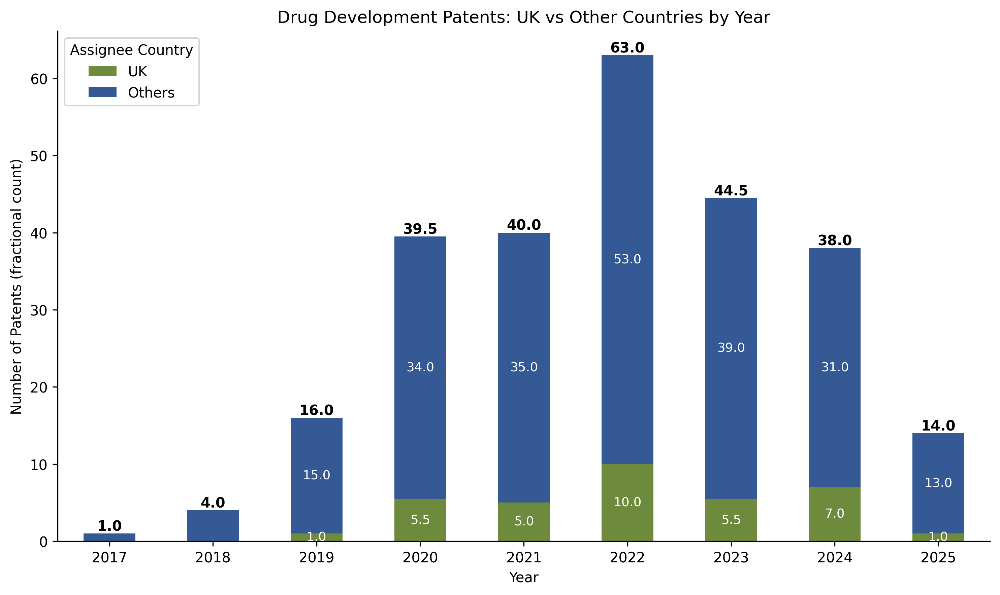

In [268]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))

df_stacked.plot(
    kind='bar',
    stacked=True,
    ax=ax,
    color=[colors_scheme[2], colors_scheme[3]],
)

totals = df_stacked.sum(axis=1)

for i, year in enumerate(df_stacked.index):
    uk = df_stacked.loc[year, 'UK']
    others = df_stacked.loc[year, 'Others']
    total = totals.loc[year]

    if uk > 0:
        ax.text(i, uk / 2, f'{uk }',
                ha='center', va='center', fontsize=9,color='white')

    if others > 0:
        ax.text(i, uk + others / 2, f'{others}',
                ha='center', va='center', fontsize=9,color='white')

for i, total in enumerate(totals):
    ax.text(i, total, f'{total:.1f}',
            ha='center', va='bottom', fontsize=10, fontweight='bold')
    
ax.set_title('Drug Development Patents: UK vs Other Countries by Year')
ax.set_xlabel('Year')
ax.set_ylabel('Number of Patents (fractional count)')
ax.legend(title='Assignee Country',loc='upper left')
# no rotation on x-axis
ax.set_xticklabels(df_stacked.index, rotation=0)
plt.tight_layout()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

In [ ]:
df_uk_drug_dev = df_drug_dev_exploded[df_drug_dev_exploded['assignee_countries']=='GB'].copy()

,abstract,additional_filters,application_number,assignee_cities,assignee_countries,assignee_names,assignees,category_for,category_for_2020,category_rcdc,...,label,confidence,rationale,drug_dev_label,development_stage,drug_dev_confidence,drug_dev_rationale,assignee_country_primary,assignee_country_source,weight
2,"<p num=""0000"">type i interferonopathies repres...",['Research Organization'],EP2024/052799,"[{'id': '2988507', 'name': 'Paris'}]",FR,"['Assistance Publique Hopitaux de Paris APHP',...","[{'acronym': 'AP-HP', 'city_name': 'Paris', 'c...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '526', 'name': 'Genetics'}, {'id': '55...",...,no,high,The patent primarily focuses on analyzing sing...,yes,preclinical,high,The patent describes the identification of a p...,FR,authority,0.25
2,"<p num=""0000"">type i interferonopathies repres...",['Research Organization'],EP2024/052799,"[{'id': '2988507', 'name': 'Paris'}]",FR,"['Assistance Publique Hopitaux de Paris APHP',...","[{'acronym': 'AP-HP', 'city_name': 'Paris', 'c...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '526', 'name': 'Genetics'}, {'id': '55...",...,no,high,The patent primarily focuses on analyzing sing...,yes,preclinical,high,The patent describes the identification of a p...,FR,authority,0.25
2,"<p num=""0000"">type i interferonopathies repres...",['Research Organization'],EP2024/052799,"[{'id': '2988507', 'name': 'Paris'}]",FR,"['Assistance Publique Hopitaux de Paris APHP',...","[{'acronym': 'AP-HP', 'city_name': 'Paris', 'c...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '526', 'name': 'Genetics'}, {'id': '55...",...,no,high,The patent primarily focuses on analyzing sing...,yes,preclinical,high,The patent describes the identification of a p...,FR,authority,0.25
2,"<p num=""0000"">type i interferonopathies repres...",['Research Organization'],EP2024/052799,"[{'id': '2988507', 'name': 'Paris'}]",FR,"['Assistance Publique Hopitaux de Paris APHP',...","[{'acronym': 'AP-HP', 'city_name': 'Paris', 'c...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '526', 'name': 'Genetics'}, {'id': '55...",...,no,high,The patent primarily focuses on analyzing sing...,yes,preclinical,high,The patent describes the identification of a p...,FR,authority,0.25
4,"<p num=""0000"">the present disclosure relates t...",NaN,EP2023/073355,"[{'id': '2653941', 'name': 'Cambridge'}]",GB,['MedImmune Ltd'],"[{'city_name': 'Cambridge', 'country_code': 'G...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '338', 'name': 'Biotechnology'}, {'id'...",...,no,high,The patent focuses on therapeutic administrati...,yes,clinical/therapeutic use,high,The patent specifically mentions the therapeut...,GB,authority,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,"<p id=""p-0001"" num=""0000"">the disclosure provi...",NaN,US18356013,NaN,US,['Flagship Pioneering Innovations VI Inc'],"[{'country_code': 'US', 'country_name': 'Unite...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '526', 'name': 'Genetics'}, {'id': '36...",...,no,high,The patent abstract focuses on genome editing ...,yes,target discovery,high,The patent focuses on genome editing and manip...,US,authority,1.00
500,"<p id=""p-0001"" num=""0000"">the present disclosu...",NaN,US17678792,"[{'id': '5140538', 'name': 'Tarrytown'}]",US,['Regeneron Pharmaceuticals Inc'],"[{'city_name': 'Tarrytown', 'country_code': 'U...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...",NaN,...,no,high,The patent abstract focuses on therapeutic com...,yes,clinical/therapeutic use

In [93]:
# drug development patents with UK assignees, by drug development stage
#df_uk_drug_dev = df_drug_dev_exploded[df_drug_dev_exploded['assignee_countries']=='GB'].copy()
df_stage = (
    df_drug_dev_exploded
    .groupby(['assignee_countries','development_stage'])
    .agg({'weight': 'sum'})
    .reset_index()
)


In [225]:
df_stage['development_stage'].unique()

array(['clinical/therapeutic use', 'target discovery', 'preclinical',
       'preclinical/therapeutic use'], dtype=object)

In [271]:
df_with_iso.loc[df_with_iso['development_stage']=='preclinical/therapeutic use',]

,abstract,additional_filters,application_number,assignee_cities,assignee_countries,assignee_names,assignees,category_for,category_for_2020,category_rcdc,...,abstract_clean,label,confidence,rationale,drug_dev_label,development_stage,drug_dev_confidence,drug_dev_rationale,assignee_country_primary,assignee_country_source
68,"<p id=""p-0001"" num=""0000"">the present disclosu...",NaN,US18819737,"[{'id': '5381396', 'name': 'Pasadena'}]",[US],['Arrowhead Pharmaceuticals Inc'],"[{'city_name': 'Pasadena', 'country_code': 'US...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '344', 'name': 'Digestive Diseases'}, ...",...,"the present disclosure relates to rnai agents,...",no,high,The patent primarily focuses on RNAi agents ta...,yes,preclinical/therapeutic use,high,The patent describes RNAi agents that inhibit ...,US,authority
468,"<p id=""p-0001"" num=""0000"">this disclosure prov...",NaN,US18477298,"[{'id': '4931972', 'name': 'Cambridge'}]",[US],['Solarea Bio Inc'],"[{'city_name': 'Cambridge', 'country_code': 'U...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '558', 'name': 'Prevention'}, {'id': '...",...,this disclosure provides for compositions (e.g...,no,high,The patent abstract focuses on live microbe po...,yes,preclinical/therapeutic use,high,The patent describes therapeutic compositions ...,US,authority
474,"<p id=""p-0001"" num=""0000"">this disclosure prov...",NaN,US18304264,"[{'id': '4931972', 'name': 'Cambridge'}]",[US],['Solarea Bio Inc'],"[{'city_name': 'Cambridge', 'country_code': 'U...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '533', 'name': 'Infectious Diseases'},...",...,this disclosure provides for compositions (e.g...,no,high,The patent abstract focuses on live microbe po...,yes,preclinical/therapeutic use,high,The patent describes therapeutic compositions ...,US,authority


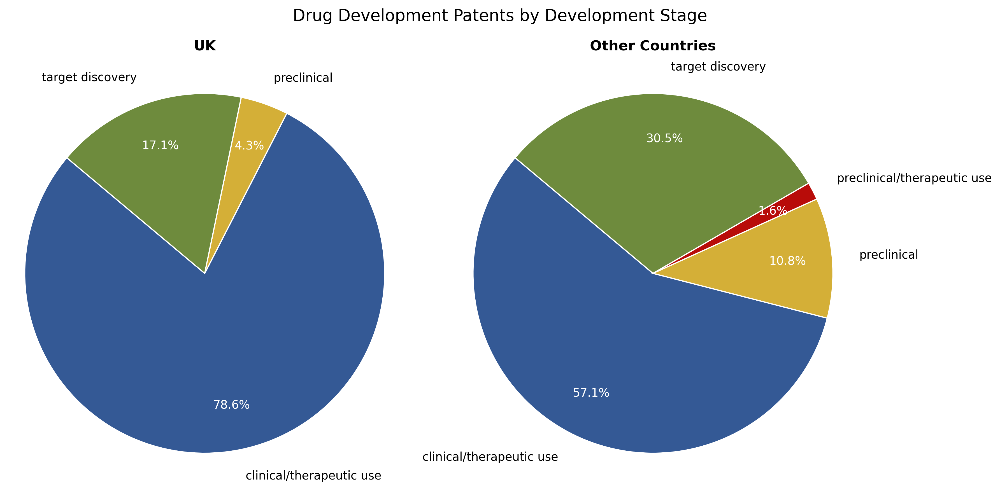

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects


# define a consistent aglobal order of development stages
stage_order = df_stage['development_stage'].dropna().unique().tolist()

# map each stage to a color (same across all pies)
stage_color_map = dict(zip(stage_order, colors_scheme[::-1]))

# --- prepare data: ensure we aggregate weights by development_stage for both groups ---
df_uk_stage = (
    df_stage[df_stage['assignee_countries'] == 'GB']
    .groupby('development_stage', as_index=False)['weight']
    .sum()
)

df_other_stage = (
    df_stage[df_stage['assignee_countries'] != 'GB']
    .groupby('development_stage', as_index=False)['weight']
    .sum()
)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# helper to draw a pie on a given axis and make autotexts white with stroke
def draw_pie(ax, values, labels, title, colors, startangle=140,
             labeldistance=1.15, pctdistance=0.75):
    wedges, texts, autotexts = ax.pie(
        values,
        labels=labels,
        autopct='%1.1f%%',
        colors=[stage_color_map.get(label, 'gray') for label in labels],
        startangle=startangle,
        labeldistance=labeldistance,
        pctdistance=pctdistance,
        wedgeprops=dict(linewidth=1, edgecolor='white')
    )

    # make percent text white + add thin black stroke for contrast
    for t in autotexts:
        t.set_color('white')
        #t.set_fontweight('bold')
        #t.set_path_effects([path_effects.withStroke(linewidth=2, foreground='black')])

    ax.set_title(title, fontweight='bold')
    ax.axis('equal')  # keep pie circular

# UK pie (draw on axs[0])
draw_pie(
    axs[0],
    values=df_uk_stage['weight'],
    labels=df_uk_stage['development_stage'],
    title='UK',
    colors=[stage_color_map.get(label, 'gray') for label in df_uk_stage['development_stage']]
)

# Others pie (draw on axs[1])
draw_pie(
    axs[1],
    values=df_other_stage['weight'],
    labels=df_other_stage['development_stage'],
    title='Other Countries',
    colors=[stage_color_map.get(label, 'gray') for label in df_other_stage['development_stage']]
)

plt.suptitle('Drug Development Patents by Development Stage', fontsize=14)
plt.tight_layout()
plt.show()

In [128]:
df_all_ukbb = pd.read_excel("data/df_dimensions.xlsx")

In [273]:
# add the UKBB papers to the patent list

def find_UKBB_papers(ids):
    ids = set(ast.literal_eval(ids)) if isinstance(ids, str) else set()
    ukbb_papers = [id for id in ids if id in df_all_ukbb['id'].tolist()]
    return ukbb_papers

df_with_iso['in_ukbb'] = df_with_iso['publication_ids'].apply(lambda x: find_UKBB_papers(x))

In [274]:
df_with_iso[['publication_ids','in_ukbb'] ]

,publication_ids,in_ukbb
0,"['pub.1112766401', 'pub.1111780547', 'pub.1163...",[pub.1112766401]
1,"['pub.1141820468', 'pub.1141616186', 'pub.1074...",[pub.1112766401]
2,"['pub.1039795218', 'pub.1013378553', 'pub.1113...","[pub.1144633680, pub.1151330353]"
3,"['pub.1067446177', 'pub.1042730311', 'pub.1017...","[pub.1125753751, pub.1144204640, pub.114187722..."
4,"['pub.1004295050', 'pub.1104567631', 'pub.1027...",[pub.1110536911]
...,...,...
499,"['pub.1036673431', 'pub.1105872645', 'pub.1015...",[pub.1140315078]
500,"['pub.1039593617', 'pub.1131841591', 'pub.1050...",[pub.1127393172]
501,"['pub.1050620379', 'pub.1032450884', 'pub.1001...",[pub.1127393172]
502,"['pub.1032055415', 'pub.1050620379', 'pub.1031...",[pub.1127393172]


In [157]:
# make a counter of the papers found
from collections import Counter
paper_counter = Counter()
for papers in df_with_iso['in_ukbb']:
    for p in papers:
        paper_counter[p] += 1

In [159]:
df_drug_dev_cited_papers = pd.DataFrame(paper_counter.items(), columns=['id', 'count']).sort_values('count', ascending=False)
df_drug_dev_cited_papers= df_drug_dev_cited_papers.merge(df_all_ukbb, on='id', how='left')

In [161]:
df_drug_dev_cited_papers.drop(columns=['Unnamed: 0.1', 'Unnamed: 0'], inplace=True)

In [162]:
df_drug_dev_cited_papers

,id,count,title,abstract,acknowledgements,altmetric,altmetric_id,authors,authors_count,category_bra,...,category_hra,funding_section,editors,subtitles,clinical_trial_ids,resulting_publication_doi,book_doi,book_title,isbn,proceedings_title
0,pub.1122360535,24,"Identification of novel risk loci, causal insi...",BACKGROUND: Genome-wide association studies (G...,Acknowledgments For details of individual fund...,320.0,69886855.0,"[{'affiliations': [{'city': 'Bethesda', 'city_...",273,"[{'id': '4000', 'name': 'Basic Science'}]",...,"[{'id': '3900', 'name': 'Biomedical'}]",The funder of the study had no role in study d...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,pub.1101086644,20,Prediction of cardiovascular risk factors from...,"Traditionally, medical discoveries are made by...","We thank C. Angermueller, A. Narayanaswamy, A....",2317.0,33397651.0,"[{'affiliations': [{'city': 'Mountain View', '...",8,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,pub.1034000276,19,Reference-based phasing using the Haplotype Re...,"Po-Ru Loh, Alkes Price and colleagues present ...","We are grateful to S. Linderman, N. Patterson,...",39.0,12404751.0,"[{'affiliations': [{'city': 'Cambridge', 'city...",12,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,pub.1125019692,16,Cognitive Deficit and White Matter Changes in ...,"BACKGROUND & AIMS: <AbstractText Label=""BACKGR...","Iain D. Croall, PhD (Conceptualization: Lead; ...",64.0,76435201.0,"[{'affiliations': [{'city': 'Sheffield', 'city...",4,"[{'id': '4003', 'name': 'Public Health'}]",...,"[{'id': '3901', 'name': 'Clinical'}]",Funding The study was funded by the Sheffield ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,pub.1006980953,13,Fast and accurate long-range phasing in a UK B...,"Po-Ru Loh, Pier Francesco Palamara and Alkes P...","We are grateful to G. Bhatia, S. Gusev, M. Lip...",24.0,8515078.0,"[{'affiliations': [{'city': 'Cambridge', 'city...",3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330,pub.1125499769,1,White Blood Cells and Blood Pressure: A Mendel...,BACKGROUND: High blood pressure (BP) is a risk...,NaN,10.0,77290667.0,"[{'affiliations': [{'city': 'Krakow', 'city_id...",14,NaN,...,NaN,NaN,NaN,['A Mendelian Randomization Study'],NaN,NaN,NaN,NaN,NaN,NaN
331,pub.1084293280,1,Characterisation of liver fat in the UK Bioban...,Non-alcoholic fatty liver disease and the risk...,Support was provided by Innovate UK 010271 [ht...,426.0,16836686.0,"[{'affiliations': [{'city': 'Oxford', 'city_id...",11,"[{'id': '4001', 'name': 'Clinical Medicine and...",...,"[{'id': '3901', 'name': 'Clinical'}]",Support was provided by Innovate UK 010271 [ht...,Sheng-Nan Lu,NaN,NaN,NaN,NaN,NaN,NaN,NaN
332,pub.1135897406,1,Variation in VKORC1 Is Associated with Vascula...,BACKGROUND: The genetic variant rs9923231 (VKO...,DLM and REM are supported by Alzheimer’s Resea...,3.0,101822715.0,"[{'affiliations': [{'city': 'Edinburgh', 'city...",8,"[{'id': '4001', 'name': 'Clinical Medicine and...",...,"[{'id': '3903', 'name': 'Population & Society'}]",NaN,M. Arfan Ikram,NaN,NaN,NaN,NaN,NaN,NaN,NaN
333,pub.1150232672,1,Plasma metabolomic profiles of dementia: a pro...,BackgroundPlasma metabolomic profile is distur...,Not Applicable.,15.0,134091417.0,"[{'affiliations': [{'city': 'Guangzhou', 'city...",17,NaN,...,NaN,The funders of the study had no role in study ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


/var/folders/04/q8s7l0r939g8fqqljjn3_rbm0000gn/T/ipykernel_61867/1279347076.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(),ha='right', fontsize=10)


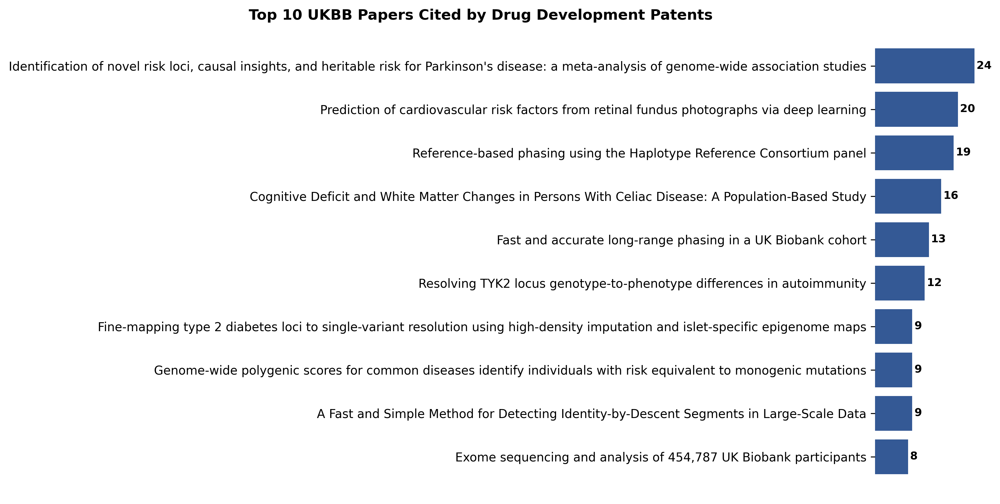

In [218]:
#visualise the top 10 counts papers by counts and name 
top_n_papers = 10

fig, ax = plt.subplots(figsize=(12,7))

top_papers = df_drug_dev_cited_papers.head(top_n_papers)
top_papers_ordered = top_papers.sort_values('count', ascending=True)
ax.barh(top_papers_ordered['title'], top_papers_ordered['count'], color=colors_scheme[3])
ax.set_yticklabels(ax.get_yticklabels(),ha='right', fontsize=10)
#plt.xlabel('Paper Title')
#ax.set_ylabel('Number of Citing Drug Development Patents')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# make the count number appear at the end of each bar
for i, (count, title) in enumerate(zip(top_papers_ordered['count'],
                                        top_papers_ordered['title'])):
    ax.text(count + 0.5, i, str(count), va='center', fontsize=9, fontweight='bold')

# make the x sticklabels invisible
ax.set_xticklabels([])
ax.set_xticks([])

ax.annotate(
    f'Top {top_n_papers} UKBB Papers Cited by Drug Development Patents',
    xy=(-6, 1.01),
    xycoords='axes fraction',
    ha='left',
    va='bottom',
    fontsize=12,
    fontweight='bold'
)

plt.subplots_adjust(left=0.8)  # or 0.55

plt.show()



In [ ]:
df_with_iso.loc[df_with_iso['drug_dev_label']=='yes'].to_csv('data/patent/drug_development_patents_with_countries.csv', index=False)

In [241]:
df_with_iso.loc[df_with_iso['label']=='yes'].to_csv('data/patent/proteomics_related_patents_with_countries.csv', index=False)

In [237]:
df_with_iso.loc[df_with_iso['label']=='yes']

,abstract,additional_filters,application_number,assignee_cities,assignee_countries,assignee_names,assignees,category_for,category_for_2020,category_rcdc,...,label,confidence,rationale,drug_dev_label,development_stage,drug_dev_confidence,drug_dev_rationale,assignee_country_primary,assignee_country_source,in_ukbb
131,"<p num=""0000"">provided herein are systems and ...",['Research Organization'],US2023/067770,"[{'id': '4984247', 'name': 'Ann Arbor'}]",[US],['University of Michigan System'],"[{'acronym': 'UM', 'city_name': 'Ann Arbor', '...","[{'id': '80005', 'name': '34 Chemical Sciences...","[{'id': '80005', 'name': '34 Chemical Sciences...","[{'id': '344', 'name': 'Digestive Diseases'}, ...",...,yes,high,The patent abstract mentions the identificatio...,no,unclear,high,The patent primarily focuses on analysis of bi...,US,authority,[pub.1143717972]
161,"<p num=""0001"">the invention relates to the fie...",['Research Organization'],CN202410618640.2,"[{'id': '1799962', 'name': 'Nanjing'}, {'id': ...","[CN, CN]","['Eye Hospital Nanjing Medical University', 'S...","[{'acronym': 'NMU', 'city_name': 'Nanjing', 'c...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '455', 'name': 'Macular Degeneration'}...",...,yes,high,The patent describes a method for diagnosing a...,no,unclear,high,The patent primarily focuses on biomarker disc...,CN,authority,[pub.1151540951]
203,"<p num=""0001"">the invention belongs to the fie...",NaN,CN202011486499.3,"[{'id': '1800163', 'name': 'Nanchang'}]",[CN],['Jiangxi Cancer Hospital (jiangxi Cancer Cent...,"[{'city_name': 'Nanchang', 'country_code': 'CN...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '344', 'name': 'Digestive Diseases'}, ...",...,yes,high,The patent involves large-scale analysis of se...,yes,clinical/therapeutic use,high,The patent describes a reagent for monitoring ...,CN,authority,[pub.1123672283]
224,"<p num=""0001"">the invention provides a protein...",NaN,CN202410395989.4,"[{'id': '1796236', 'name': 'Shanghai'}]",[CN],['Shanghai Mental Health Center Shanghai Psych...,"[{'acronym': 'SMHC', 'city_name': 'Shanghai', ...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '380', 'name': 'Mental Health'}, {'id'...",...,yes,high,The patent primarily concerns the identificati...,no,unclear,high,The patent abstract focuses on the identificat...,CN,authority,[pub.1143539276]
421,"<p num=""0001"">the invention relates to the fie...",NaN,CN202311686767.X,"[{'id': '1809858', 'name': 'Guangzhou'}]",[CN],['Nanfang Hospital of Southern Medical Univers...,"[{'city_name': 'Guangzhou', 'country_code': 'C...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '410', 'name': 'Lung'}, {'id': '478', ...",...,yes,high,The patent involves high-throughput metabolism...,no,unclear,high,The patent abstract describes a system for pre...,CN,authority,[pub.1165260245]
443,<p>as a biomarker for predicting cardiovascula...,NaN,KR1020200067858,"[{'id': '1835848', 'name': 'Seoul'}]",[KR],"['한국과학기술연구원', '한양대학교 산학협력단']","[{'acronym': 'KIST', 'city_name': 'Seoul', 'co...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '80003', 'name': '32 Biomedical and Cl...","[{'id': '378', 'name': 'Psoriasis'}, {'id': '5...",...,yes,high,The patent describes a set of proteins (biomar...,yes,clinical/therapeutic use,high,The patent describes the use of biomarkers for...,KR,authority,[pub.1117476952]
459,"<p num=""0000"">the present invention relates to...",NaN,EP2024/060636,NaN,[None],['Startquake SL'],NaN,"[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '80002', 'name': '31 Biological Scienc...","[{'id': '295', 'name': 'Aging'}]",...,yes,high,The patent involves large-scale analysis of pr...,no,unclear,high,The patent abstract describes a method for ass..

In [240]:
df_with_iso[['year','date','date_inserted']]

,year,date,date_inserted
0,2024,2024-11-07,2025-05-15
1,2024,2024-05-29,2024-12-05
2,2024,2024-02-05,2024-08-15
3,2023,2023-10-09,2024-04-18
4,2023,2023-08-25,2024-02-29
...,...,...,...
499,2023,2023-07-20,2024-07-02
500,2022,2022-02-23,2024-01-09
501,2020,2020-09-24,2023-12-19
502,2020,2020-01-21,2023-09-26


provided herein are systems and methods for analysis of biological samples to identify biomarkers associated with nonalcoholic fatty liver disease. for example, provided herein are molecular signatures that find use in characterizing samples to facilitate research, drug discovery, and treatment associated with nonalcoholic fatty liver disease.

In [47]:
df_patent["drug_dev_label"].value_counts(dropna=False)

drug_dev_label
no      258
yes     230
None     25
Name: count, dtype: int64

In [83]:
df_patent['abstract']

0      <p num="0000">The present techniques generally...
1      <p num="0000">The present invention relates to...
2      <p num="0000">Type I interferonopathies repres...
3      <p num="0000">The invention relates to a metho...
4      <p num="0000">The present disclosure relates t...
                             ...                        
508    <p id="p-0001" num="0000">The present disclosu...
509    <p id="p-0001" num="0000">The present disclosu...
510    <p id="p-0001" num="0000">The invention provid...
511    <p id="p-0001" num="0000">The invention provid...
512    <p id="p-0001" num="0000">The invention provid...
Name: abstract, Length: 513, dtype: object

In [3]:
df_drug_dev = df_patent.copy()
df_drug_dev.drop(index=df_drug_dev.loc[df_drug_dev['abstract'].isna()].index, inplace=True)

In [1]:
import os 
os.getcwd()

'/Users/valler/Python/RA/20_years_of_ukb/src'

In [5]:
df_drug_dev['drug_dev_label'].value_counts(dropna=False)

drug_dev_label
no     258
yes    230
NaN     25
Name: count, dtype: int64

## scibert

In [ ]:
# firstly read files 
df_drug_dev = pd.read_csv("/Users/valler/Python/RA/20_years_of_ukb/data/patent/patent_drug_dev_checkpoint.csv")
len(df_drug_dev)

# add other file results 
for model_name in ["mistral7b","phi3mini",'qwen25_7b','sbert','scibert']:
    df_temp = pd.read_csv(f"/Users/valler/Python/RA/20_years_of_ukb/file/replica_jiani_new_3_LLM_tagging_results/patents_tagged_{model_name}.csv")
    df_temp.rename(columns={'drugdev_label':'drug_dev_label_'+model_name,
       'drugdev_development_stage': 'drug_dev_development_stage_'+model_name,
       'drugdev_confidence': 'drug_dev_confidence_'+model_name,
       'drugdev_rationale': 'drug_dev_rationale_'+model_name,
       'drugdev_model': 'drug_dev_model_'+model_name}, inplace=True)
    df_drug_dev = df_drug_dev.merge(df_temp[['id',
       'drug_dev_label_'+model_name,
       'drug_dev_development_stage_'+model_name,
       'drug_dev_confidence_'+model_name,
       'drug_dev_rationale_'+model_name,
       'drug_dev_model_'+model_name]], on='id', how='left')

In [ ]:
import pandas as pd
from collections import Counter

# df is your DataFrame; change the names below to your actual LLM label columns
llm_cols = ['drug_dev_label',
 'drug_dev_label_mistral7b',
 'drug_dev_label_phi3mini',
 'drug_dev_label_qwen25_7b']  # values like "yes"/"no"

def consensus_label(row):
    votes = [row[c] for c in llm_cols]
    cnt = Counter(votes)
    most_common, count = cnt.most_common(1)[0]
    # unanimous?
    unanimous = (count == len(llm_cols))
    # majority?
    majority = (count >= (len(llm_cols) // 2) + 1)
    return {
        "consensus_label": most_common,
        "unanimous": unanimous,
        "majority": majority,
        "n_agree": count
    }

cons = df_drug_dev.apply(consensus_label, axis=1, result_type="expand")
df_drug_scibert = pd.concat([df_drug_dev, cons], axis=1)

# Subsets
df_unanimous = df_drug_scibert[df_drug_scibert["unanimous"]]
df_majority = df_drug_scibert[df_drug_scibert["majority"]]
df_disagree = df_drug_scibert[~df_drug_scibert["majority"]]

print("unanimous:", len(df_unanimous), "majority:", len(df_majority), "disagree:", len(df_disagree))

In [ ]:
from transformers import AutoModel, AutoTokenizer, AutoModelForSequenceClassification, TrainingArguments, Trainer
from datasets import Dataset


MODEL = "allenai/scibert_scivocab_uncased"
CACHE = "/Users/valler/Python/local_LLMs"
text_col = "abstract_clean"
label_col = "consensus_label"  # values "yes"/"no"

# take unanimous set
train_df = df_unanimous.sample(frac=1.0, random_state=42).reset_index(drop=True)

# map label -> id
label_map = {"no": 0, "yes": 1}
train_df["label_id"] = train_df[label_col].map(label_map)

ds = Dataset.from_pandas(train_df[[text_col, "label_id"]].rename(columns={text_col:"text", "label_id":"labels"}))

tokenizer = AutoTokenizer.from_pretrained(
    MODEL,
    cache_dir=CACHE,
    local_files_only=True
)


def tok(batch): return tokenizer(batch["text"], truncation=True, padding="max_length", max_length=256)
ds = ds.map(tok, batched=True)
ds.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])



model = AutoModelForSequenceClassification.from_pretrained(
    MODEL,
    cache_dir=CACHE,
    local_files_only=True
)

training_args = TrainingArguments(
    output_dir="./scibert_consensus",
    per_device_train_batch_size=16,
    per_device_eval_batch_size=64,
    num_train_epochs=3,
    #evaluation_strategy="no",
    logging_steps=100,
    learning_rate=2e-5,
    save_total_limit=2,
)

trainer = Trainer(model=model, args=training_args, train_dataset=ds)
trainer.train()
trainer.save_model("./scibert_consensus")
tokenizer.save_pretrained("./scibert_consensus")

In [ ]:
from datasets import Dataset
import torch
# df is your full dataframe
infer_df = df_drug_dev.copy()
infer_df.drop(index=infer_df.loc[infer_df['abstract_clean'].isna()].index, inplace=True)

ds_infer = Dataset.from_pandas(
    infer_df[["abstract_clean"]].rename(columns={"abstract_clean": "text"})
)


def tok(batch):
    return tokenizer(batch["text"], truncation=True, padding="max_length", max_length=256)

ds_infer = ds_infer.map(tok, batched=True)
ds_infer.set_format(type="torch", columns=["input_ids", "attention_mask"])


# run prediction 
pred_out = trainer.predict(ds_infer)
logits = pred_out.predictions

# get the prediction labels and probabilities
probs = torch.softmax(torch.tensor(logits), dim=-1).numpy()
pred_ids = probs.argmax(axis=1)

id2label = {0: "no", 1: "yes"}

infer_df["drugdev_label_scibert"] = [id2label[i] for i in pred_ids]
infer_df["drugdev_prob_yes_scibert"] = probs[:, 1]
infer_df["drugdev_confidence_scibert"] = np.where(
    probs.max(axis=1) >= 0.9, "high",
    np.where(probs.max(axis=1) >= 0.7, "medium", "low")
)

infer_df.to_csv("patents_scibert_consensus_labeled.csv", index=False)

# Model Concordance Analysis

In [2]:
# firstly read files 
df_drug_dev = pd.read_csv("/Users/valler/Python/RA/20_years_of_ukb/data/patent/patent_drug_dev_checkpoint.csv")
len(df_drug_dev)

# add other file results 
for model_name in ["mistral7b","phi3mini",'qwen25_7b','sbert','scibert']:
    df_temp = pd.read_csv(f"/Users/valler/Python/RA/20_years_of_ukb/file/replica_jiani_new_3_LLM_tagging_results/patents_tagged_{model_name}.csv")
    df_temp.rename(columns={'drugdev_label':'drug_dev_label_'+model_name,
       'drugdev_development_stage': 'drug_dev_development_stage_'+model_name,
       'drugdev_confidence': 'drug_dev_confidence_'+model_name,
       'drugdev_rationale': 'drug_dev_rationale_'+model_name,
       'drugdev_model': 'drug_dev_model_'+model_name}, inplace=True)
    df_drug_dev = df_drug_dev.merge(df_temp[['id',
       'drug_dev_label_'+model_name,
       'drug_dev_development_stage_'+model_name,
       'drug_dev_confidence_'+model_name,
       'drug_dev_rationale_'+model_name,
       'drug_dev_model_'+model_name]], on='id', how='left')

In [ ]:
if infer_df is not None:
    infer_df.rename(columns={"drugdev_label_scibert": "drug_dev_label_scibert_trained", 
                             "drugdev_prob_yes_scibert": "drug_dev_prob_yes_scibert_trained", 
                             "drugdev_confidence_scibert": "drug_dev_confidence_scibert_trained"}, inplace=True)
    df_drug_dev = df_drug_dev.merge(
        infer_df[["id", "drug_dev_label_scibert_trained", "drug_dev_prob_yes_scibert_trained", "drug_dev_confidence_scibert_trained"]],
        on="id",
        how="left"
    )

In [9]:
df_drug_dev[[col for col in df_drug_dev.columns if 'drug_dev_label' in col]].value_counts(dropna=False)

drug_dev_label  drug_dev_label_mistral7b  drug_dev_label_phi3mini  drug_dev_label_qwen25_7b  drug_dev_label_sbert  drug_dev_label_scibert  drug_dev_label_scibert_trained
no              no                        no                       no                        yes                   yes                     no                                142
yes             yes                       yes                      yes                       yes                   yes                     yes                               130
no              no                        no                       no                        no                    yes                     no                                 70
yes             yes                       no                       yes                       yes                   yes                     yes                                24
no              no                        no                       no                        yes                   no     

In [10]:
# Define the four models and their label columns
model_labels = {
    'llama3.1:8b': 'drug_dev_label',
    'mistral7b': 'drug_dev_label_mistral7b',
    'phi3mini': 'drug_dev_label_phi3mini',
    'qwen25_7b': 'drug_dev_label_qwen25_7b',
    'sbert': 'drug_dev_label_sbert',
    'scibert': 'drug_dev_label_scibert',
    'scibert_trained': 'drug_dev_label_scibert_trained'
}

# Create a subset dataframe with only the label columns
df_concordance = df_drug_dev[list(model_labels.values())].copy()

# Display basic statistics
print("=" * 60)
print("LABEL DISTRIBUTION BY MODEL")
print("=" * 60)
for model_name, col in model_labels.items():
    print(f"\n{model_name}:")
    print(df_concordance[col].value_counts(dropna=False))
    print(f"  Yes rate: {(df_concordance[col] == 'yes').sum() / len(df_concordance) * 100:.2f}%")

LABEL DISTRIBUTION BY MODEL

llama3.1:8b:
drug_dev_label
no     267
yes    230
NaN     16
Name: count, dtype: int64
  Yes rate: 44.83%

mistral7b:
drug_dev_label_mistral7b
no     281
yes    232
Name: count, dtype: int64
  Yes rate: 45.22%

phi3mini:
drug_dev_label_phi3mini
no     326
yes    187
Name: count, dtype: int64
  Yes rate: 36.45%

qwen25_7b:
drug_dev_label_qwen25_7b
no     329
yes    184
Name: count, dtype: int64
  Yes rate: 35.87%

sbert:
drug_dev_label_sbert
yes    411
no     102
Name: count, dtype: int64
  Yes rate: 80.12%

scibert:
drug_dev_label_scibert
yes    464
no      49
Name: count, dtype: int64
  Yes rate: 90.45%

scibert_trained:
drug_dev_label_scibert_trained
no     294
yes    203
NaN     16
Name: count, dtype: int64
  Yes rate: 39.57%


In [11]:
# Overall agreement: count how many models agree on each patent
df_concordance['yes_count'] = (df_concordance[list(model_labels.values())] == 'yes').sum(axis=1)
df_concordance['no_count'] = (df_concordance[list(model_labels.values())] == 'no').sum(axis=1)

print("\n" + "=" * 60)
print("OVERALL AGREEMENT ACROSS ALL 4 MODELS")
print("=" * 60)
agreement_dist = df_concordance['yes_count'].value_counts().sort_index()
print("\nNumber of 'yes' labels per patent:")
for n_yes, count in agreement_dist.items():
    pct = count / len(df_concordance) * 100
    print(f"  {n_yes} models say 'yes': {count} patents ({pct:.2f}%)")

# Full agreement (all 4 agree)
all_yes = (df_concordance['yes_count'] == 4).sum()
all_no = (df_concordance['no_count'] == 4).sum()
full_agreement = all_yes + all_no
print(f"\nFull agreement (all 4 models agree): {full_agreement} / {len(df_concordance)} ({full_agreement/len(df_concordance)*100:.2f}%)")
print(f"  - All say 'yes': {all_yes} ({all_yes/len(df_concordance)*100:.2f}%)")
print(f"  - All say 'no': {all_no} ({all_no/len(df_concordance)*100:.2f}%)")

# Majority agreement (3 or 4 agree)
majority_yes = (df_concordance['yes_count'] >= 3).sum()
majority_no = (df_concordance['no_count'] >= 3).sum()
print(f"\nMajority agreement (3+ models agree): {majority_yes + majority_no} / {len(df_concordance)} ({(majority_yes + majority_no)/len(df_concordance)*100:.2f}%)")

# Split decision (2-2)
split = (df_concordance['yes_count'] == 2).sum()
print(f"\nSplit decision (2-2): {split} patents ({split/len(df_concordance)*100:.2f}%)")


OVERALL AGREEMENT ACROSS ALL 4 MODELS

Number of 'yes' labels per patent:
  0 models say 'yes': 16 patents (3.12%)
  1 models say 'yes': 91 patents (17.74%)
  2 models say 'yes': 151 patents (29.43%)
  3 models say 'yes': 19 patents (3.70%)
  4 models say 'yes': 27 patents (5.26%)
  5 models say 'yes': 31 patents (6.04%)
  6 models say 'yes': 48 patents (9.36%)
  7 models say 'yes': 130 patents (25.34%)

Full agreement (all 4 models agree): 46 / 513 (8.97%)
  - All say 'yes': 27 (5.26%)
  - All say 'no': 19 (3.70%)

Majority agreement (3+ models agree): 543 / 513 (105.85%)

Split decision (2-2): 151 patents (29.43%)


In [12]:
# Pairwise agreement between models
from sklearn.metrics import cohen_kappa_score, accuracy_score
from itertools import combinations

print("\n" + "=" * 60)
print("PAIRWISE AGREEMENT BETWEEN MODELS")
print("=" * 60)

pairwise_results = []
for (model1_name, col1), (model2_name, col2) in combinations(model_labels.items(), 2):
    # Only consider rows where both models have labels
    mask = df_concordance[col1].notna() & df_concordance[col2].notna()
    
    if mask.sum() > 0:
        agreement = (df_concordance.loc[mask, col1] == df_concordance.loc[mask, col2]).sum()
        total = mask.sum()
        pct = agreement / total * 100
        
        # Calculate Cohen's Kappa for inter-rater reliability
        kappa = cohen_kappa_score(df_concordance.loc[mask, col1], df_concordance.loc[mask, col2])
        
        pairwise_results.append({
            'Model 1': model1_name,
            'Model 2': model2_name,
            'Agreement': agreement,
            'Total': total,
            'Agreement %': pct,
            'Cohen\'s Kappa': kappa
        })


df_pairwise = pd.DataFrame(pairwise_results)
df_pairwise


PAIRWISE AGREEMENT BETWEEN MODELS


,Model 1,Model 2,Agreement,Total,Agreement %,Cohen's Kappa
0,llama3.1:8b,mistral7b,443,497,89.134809,0.780560
1,llama3.1:8b,phi3mini,434,497,87.323944,0.740453
2,llama3.1:8b,qwen25_7b,447,497,89.939638,0.794828
3,llama3.1:8b,sbert,316,497,63.581489,0.302253
4,llama3.1:8b,scibert,259,497,52.112676,0.096267
5,llama3.1:8b,scibert_trained,466,497,93.762575,0.873528
6,mistral7b,phi3mini,426,513,83.040936,0.651807
7,mistral7b,qwen25_7b,433,513,84.405458,0.679455
8,mistral7b,sbert,306,513,59.649123,0.236887
9,mistral7b,scibert,261,513,50.877193,0.088013


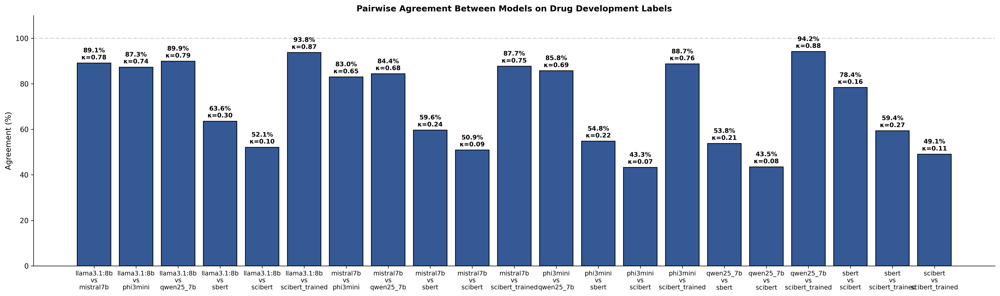

In [16]:
# Visualize pairwise agreement
fig, ax = plt.subplots(figsize=(20, 6))

x_pos = np.arange(len(df_pairwise))
bars = ax.bar(x_pos, df_pairwise['Agreement %'], color=colors_scheme[3], edgecolor='black')

# Add value labels on bars
for i, (bar, val, kappa) in enumerate(zip(bars, df_pairwise['Agreement %'], df_pairwise['Cohen\'s Kappa'])):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, 
            f'{val:.1f}%\nκ={kappa:.2f}', 
            ha='center', va='bottom', fontsize=9, fontweight='bold')

# X-axis labels
pair_labels = [f"{row['Model 1']}\nvs\n{row['Model 2']}" for _, row in df_pairwise.iterrows()]
ax.set_xticks(x_pos)
ax.set_xticklabels(pair_labels, fontsize=9)

ax.set_ylabel('Agreement (%)', fontsize=11)
ax.set_title('Pairwise Agreement Between Models on Drug Development Labels', fontsize=12, fontweight='bold')
ax.set_ylim(0, 110)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.axhline(y=100, color='gray', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

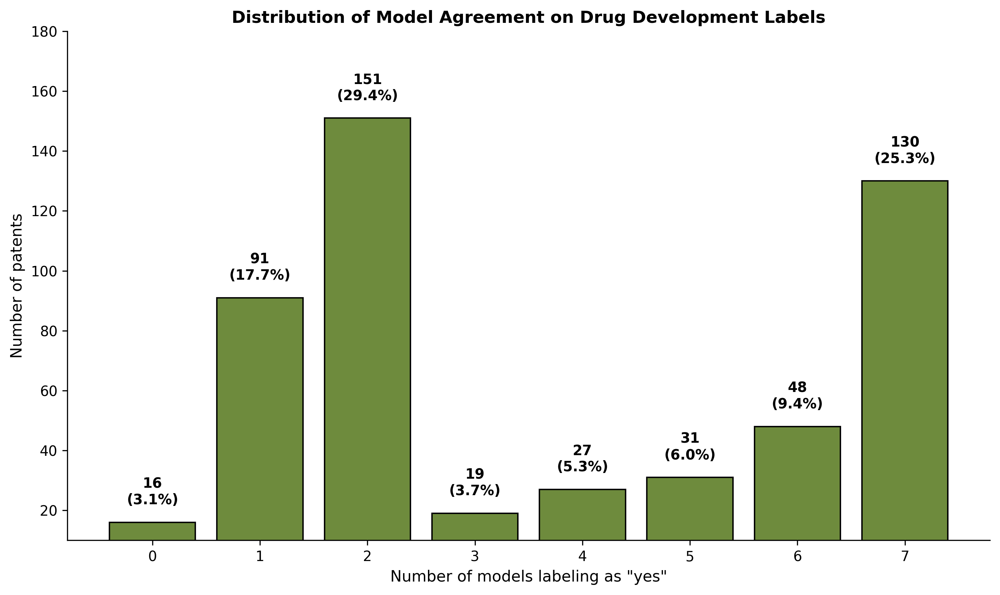

In [18]:
# Visualize overall agreement distribution
fig, ax = plt.subplots(figsize=(10, 6))

agreement_counts = df_concordance['yes_count'].value_counts().sort_index()
bars = ax.bar(agreement_counts.index, agreement_counts.values, color=colors_scheme[2], edgecolor='black')

# Add value labels
for bar, val in zip(bars, agreement_counts.values):
    pct = val / len(df_concordance) * 100
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, 
            f'{val}\n({pct:.1f}%)', 
            ha='center', va='bottom', fontsize=10, fontweight='bold')

ax.set_xlabel('Number of models labeling as "yes"', fontsize=11)
ax.set_ylabel('Number of patents', fontsize=11)
ax.set_title('Distribution of Model Agreement on Drug Development Labels', fontsize=12, fontweight='bold')
ax.set_xticks([0, 1, 2, 3, 4,5,6,7])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylim(10,180)
plt.tight_layout()
plt.show()

In [22]:
# Create a confusion matrix-style heatmap for all model combinations
import seaborn as sns

# Create a cross-tabulation for each pair
print("\n" + "=" * 60)
print("CONFUSION MATRICES (Yes/No)")
print("=" * 60)

for (model1_name, col1), (model2_name, col2) in combinations(model_labels.items(), 2):
    print(f"\n{model1_name} vs {model2_name}:")
    ct = pd.crosstab(df_concordance[col1], df_concordance[col2], 
                      rownames=[model1_name], colnames=[model2_name], 
                      margins=True, dropna=False)
    print(ct)


CONFUSION MATRICES (Yes/No)

llama3.1:8b vs mistral7b:
mistral7b     no  yes    All
llama3.1:8b                 
no           239   19  258.0
yes           34  196  230.0
NaN            0   16    NaN
All          273  231  504.0

llama3.1:8b vs phi3mini:
phi3mini      no  yes    All
llama3.1:8b                 
no           256    2  258.0
yes           61  169  230.0
NaN            0   16    NaN
All          317  187  504.0

llama3.1:8b vs qwen25_7b:
qwen25_7b     no  yes    All
llama3.1:8b                 
no           256    2  258.0
yes           48  182  230.0
NaN           16    0    NaN
All          320  184  504.0

mistral7b vs phi3mini:
phi3mini    no  yes  All
mistral7b               
no         252   21  273
yes         65  166  231
All        317  187  504

mistral7b vs qwen25_7b:
qwen25_7b   no  yes  All
mistral7b               
no         257   16  273
yes         63  168  231
All        320  184  504

phi3mini vs qwen25_7b:
qwen25_7b   no  yes  All
phi3mini             

In [19]:
# Analyze disagreement patterns: identify patents where models disagree most
df_concordance['agreement_level'] = df_concordance.apply(
    lambda row: 'Full agreement (6-0)' if row['yes_count'] in [0, 6] 
    else 'Strong majority (4-2)' if row['yes_count'] in [2, 4]
    else 'Split (3-3)', axis=1
)

print("\n" + "=" * 60)
print("AGREEMENT LEVEL SUMMARY")
print("=" * 60)
print(df_concordance['agreement_level'].value_counts())

# For split decisions, examine a few examples
print("\n" + "=" * 60)
print("EXAMPLES OF SPLIT DECISIONS (3-3)")
print("=" * 60)
split_cases = df_concordance[df_concordance['agreement_level'] == 'Split (3-3)']
if len(split_cases) > 0:
    print(f"Total split cases: {len(split_cases)}")
    # Show which models agree in split cases
    for idx in split_cases.head(5).index:
        labels = {name: df_concordance.loc[idx, col] for name, col in model_labels.items()}
        print(f"\nPatent index {idx}:")
        for model, label in labels.items():
            print(f"  {model}: {label}")
else:
    print("No split decisions found.")


AGREEMENT LEVEL SUMMARY
agreement_level
Split (3-3)              271
Strong majority (4-2)    178
Full agreement (6-0)      64
Name: count, dtype: int64

EXAMPLES OF SPLIT DECISIONS (3-3)
Total split cases: 271

Patent index 0:
  llama3.1:8b: no
  mistral7b: no
  phi3mini: no
  qwen25_7b: no
  sbert: no
  scibert: yes
  scibert_trained: no

Patent index 2:
  llama3.1:8b: yes
  mistral7b: no
  phi3mini: yes
  qwen25_7b: yes
  sbert: yes
  scibert: no
  scibert_trained: yes

Patent index 4:
  llama3.1:8b: yes
  mistral7b: yes
  phi3mini: yes
  qwen25_7b: yes
  sbert: yes
  scibert: yes
  scibert_trained: yes

Patent index 6:
  llama3.1:8b: no
  mistral7b: no
  phi3mini: no
  qwen25_7b: no
  sbert: no
  scibert: yes
  scibert_trained: no

Patent index 13:
  llama3.1:8b: no
  mistral7b: no
  phi3mini: no
  qwen25_7b: no
  sbert: no
  scibert: yes
  scibert_trained: no


In [20]:
# Summary table: compare all models side by side
summary_data = []
for model_name, col in model_labels.items():
    yes_count = (df_concordance[col] == 'yes').sum()
    no_count = (df_concordance[col] == 'no').sum()
    na_count = df_concordance[col].isna().sum()
    yes_pct = yes_count / len(df_concordance) * 100
    
    summary_data.append({
        'Model': model_name,
        'Yes': yes_count,
        'No': no_count,
        'NA': na_count,
        'Yes %': yes_pct
    })

df_summary = pd.DataFrame(summary_data)

print("\n" + "=" * 60)
print("MODEL SUMMARY TABLE")
print("=" * 60)
print(df_summary.to_string(index=False))

# Calculate Fleiss' Kappa for all 4 raters
from statsmodels.stats.inter_rater import fleiss_kappa

# Prepare data for Fleiss' Kappa: each row is a patent, columns are rating counts
# We need to count how many raters gave each label (yes/no) for each patent
def prepare_fleiss_data(df, label_cols):
    data = []
    for idx in df.index:
        yes_count = sum([df.loc[idx, col] == 'yes' for col in label_cols if pd.notna(df.loc[idx, col])])
        no_count = sum([df.loc[idx, col] == 'no' for col in label_cols if pd.notna(df.loc[idx, col])])
        # Only include if we have ratings from all models
        if yes_count + no_count == len(label_cols):
            data.append([yes_count, no_count])
    return np.array(data)

fleiss_data = prepare_fleiss_data(df_concordance, list(model_labels.values()))
if len(fleiss_data) > 0:
    kappa = fleiss_kappa(fleiss_data)
    print(f"\n" + "=" * 60)
    print(f"FLEISS' KAPPA (inter-rater reliability for all 4 models): {kappa:.4f}")
    print("=" * 60)
    print("Interpretation:")
    print("  < 0.00: Poor agreement")
    print("  0.00-0.20: Slight agreement")
    print("  0.21-0.40: Fair agreement")
    print("  0.41-0.60: Moderate agreement")
    print("  0.61-0.80: Substantial agreement")
    print("  0.81-1.00: Almost perfect agreement")
else:
    print("\nCannot calculate Fleiss' Kappa - insufficient complete data.")


MODEL SUMMARY TABLE
          Model  Yes  No  NA     Yes %
    llama3.1:8b  230 267  16 44.834308
      mistral7b  232 281   0 45.224172
       phi3mini  187 326   0 36.452242
      qwen25_7b  184 329   0 35.867446
          sbert  411 102   0 80.116959
        scibert  464  49   0 90.448343
scibert_trained  203 294  16 39.571150

FLEISS' KAPPA (inter-rater reliability for all 4 models): 0.4202
Interpretation:
  < 0.00: Poor agreement
  0.00-0.20: Slight agreement
  0.21-0.40: Fair agreement
  0.41-0.60: Moderate agreement
  0.61-0.80: Substantial agreement
  0.81-1.00: Almost perfect agreement
